In [1]:
import numpy as np
import pandas as pd
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
from aging.behavior.bio_age_model import fit_model, masked_xval, stratified_xval
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    PlotConfig,
    save_factory,
)
from sklearn.preprocessing import OneHotEncoder
from tqdm.auto import tqdm
from itertools import product
from toolz import valmap, keyfilter, pluck, reduce

import colorcet as cc
from sklearn.preprocessing import LabelEncoder

from operator import or_

from aging.behavior.bio_age_model import model_fun_v5, get_biological_age
from toolz import dissoc

from aging.behavior.bio_age_model import (
    model_setup,
    model_fun_v2,
    compute_concentrations,
    expected_counts,
    concentration_interpolation,
    create_masks,
    compute_heldout_r2,
)
from sklearn.metrics import r2_score
from pathlib import Path

import joblib
from toolz import drop
import random

In [2]:
format_plots()

In [3]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()


def quantile(n):
    def percentile_(x):
        return x.quantile(n)

    percentile_.__name__ = "q_{:0.02f}".format(n)
    return percentile_


def read_male_ontogeny(use_syllables=None):
    df = pd.read_parquet(
        "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_relabeled_counts_matrix_v00.parquet"
    )
    df = df.sort_index(axis=1)
    df = df.query("age < 100")

    pth = "/n/groups/datta/win/longtogeny/data/ontogeny/version_11/ontogeny_males_mouse_area_df_v00.parquet"
    size_df = pd.read_parquet(pth)

    sizes_col = zscore(size_df.groupby("age")["quant_0.5"].transform(demean))
    sizes_col = sizes_col.loc[df.index]
    df = df.loc[sizes_col.index]

    if use_syllables is None:
        avg_age_usages = df.groupby("age", observed=True).mean()
        syll_mask = (avg_age_usages.var() > 15) & (avg_age_usages.quantile(0.95) > 20)
        print(syll_mask.sum(), "syllables")

        df = df.loc[:, syll_mask]

        male_sylls = syll_mask.index[syll_mask]
    else:
        df = df[use_syllables]
        male_sylls = None
    return df, sizes_col, male_sylls

In [4]:
df, sizes_col, male_sylls = read_male_ontogeny()
age = jnp.array(df.index.get_level_values("age"))
syllable_counts_jax = jnp.array(df.astype(float))

56 syllables


In [5]:
features = {
    "ages": age,
    "counts": syllable_counts_jax + 1,
    "sizes": sizes_col.to_numpy(),
}

hypparams = {
    "min_age": 1,
    "max_age": 100,
    "age_sd": 9,  # weeks
    "bio_params_sd": 3,
    "size_params_sd": 1000,
    "n_age_samples": 1000,
    "n_splines": 9,
    "n_size_splines": 5,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "lr": 0.2,
    "n_opt_iter": 125,
    "use_rw_prior": True,
    "rw_sd": 100
}

In [9]:
tmp = masked_xval(features, hypparams, 2, n_repeats=1)

  0%|          | 0/1 [00:00<?, ?it/s]

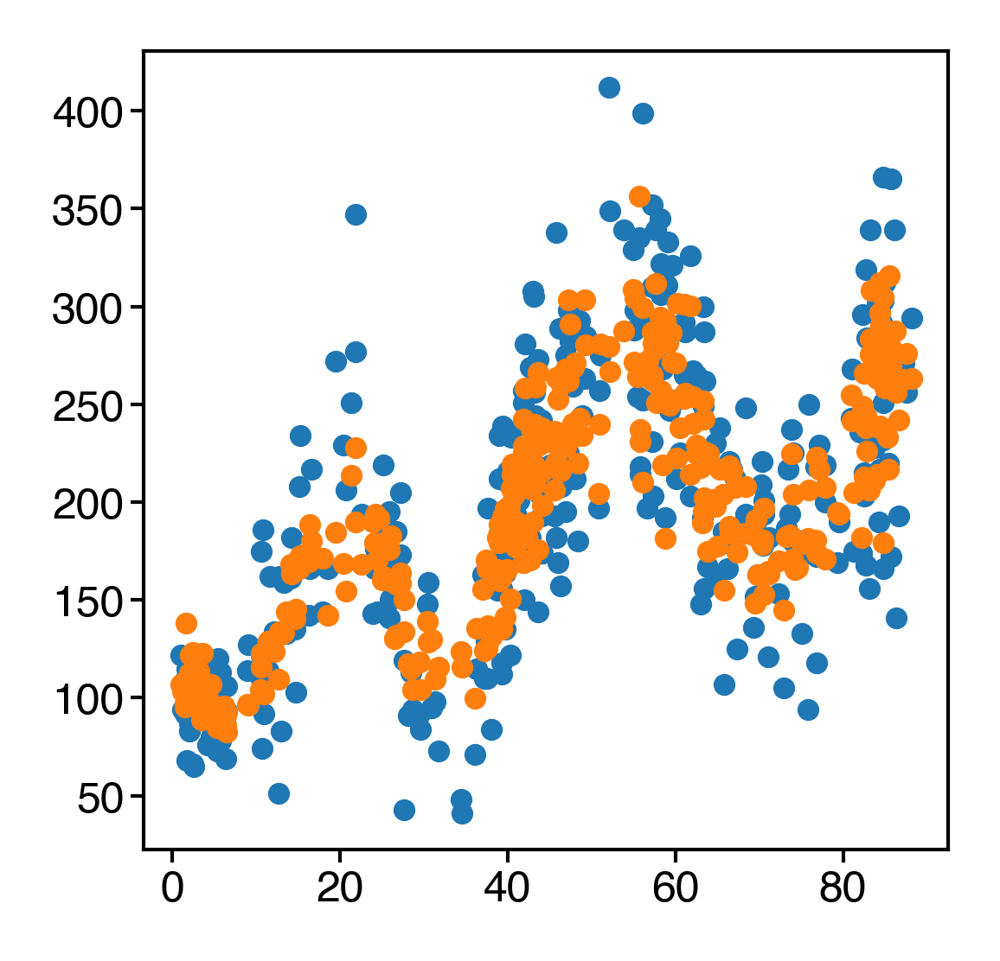

In [10]:
ba = tmp[0]['bio_ages']
ca = tmp[0]['true_ages']
pc = tmp[0]['predicted_counts'][:, 0]
c = tmp[0]['counts'][:, 0]
figure(2, 2)
plt.scatter(ba, c, s=5)
plt.scatter(ba, pc, s=5)

In [6]:
rw_prior = np.logspace(-1, 2, 7)

age_sd = np.arange(1, 22, 5)

n_splines = range(4, 11, 2)

In [7]:
random.seed(0)
grid = list(product(n_splines, age_sd, rw_prior))
random.shuffle(grid)

out = []
for i, (_n_splines, _age_sd, _rw_prior) in enumerate(tqdm(grid)):
    hypparams["n_splines"] = _n_splines
    hypparams["age_sd"] = float(_age_sd)
    hypparams["rw_sd"] = float(_rw_prior)
    try:
        tmp = masked_xval(features, hypparams, 2, n_repeats=4, disable_tqdm=True)
        for v in tmp.values():
            v["init_components"].age_normalizer = None
            v["init_components"].age_unnormalizer = None
        tmp["grid_params"] = keyfilter(
            lambda k: k in ["n_splines", "age_sd", "rw_sd"], hypparams
        )
        joblib.dump(
            tmp,
            f"/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior/ontogeny-gridsearch-2024-04-10-iter-{i:03d}.p",
        )
        heldout_ll = list(
            pluck("heldout_ll", keyfilter(lambda k: isinstance(k, int), tmp).values())
        )
        heldout_ll = np.mean(heldout_ll)
        heldout_r2 = list(
            pluck(
                "heldout_r2_total_v3", keyfilter(lambda k: isinstance(k, int), tmp).values()
            )
        )
        heldout_r2 = np.mean(heldout_r2)
        param_norm = np.mean(
            [
                np.linalg.norm(v["params"]["bio_basis_weights"], axis=1).mean()
                for v in keyfilter(lambda k: isinstance(k, int), tmp).values()
            ]
        )
        out.append(
            {
                **tmp["grid_params"],
                "param_norm": param_norm,
                "heldout_ll": heldout_ll,
                "heldout_r2": heldout_r2,
            }
        )
        if out[-1]['heldout_r2'] > 0.2:
            print(i, out[-1])
    except ValueError:
        continue
out = pd.DataFrame(out)

  0%|          | 0/140 [00:00<?, ?it/s]

0 {'age_sd': 11.0, 'n_splines': 4, 'rw_sd': 31.622776601683793, 'param_norm': 3.9042032, 'heldout_ll': -392565.0, 'heldout_r2': 0.5060748758726981}
1 {'age_sd': 11.0, 'n_splines': 6, 'rw_sd': 10.0, 'param_norm': 4.660825, 'heldout_ll': -392169.25, 'heldout_r2': 0.5100460946216513}
3 {'age_sd': 6.0, 'n_splines': 10, 'rw_sd': 31.622776601683793, 'param_norm': 6.723558, 'heldout_ll': -392202.75, 'heldout_r2': 0.5281822169757786}
4 {'age_sd': 11.0, 'n_splines': 10, 'rw_sd': 1.0, 'param_norm': 6.0789237, 'heldout_ll': -392897.5, 'heldout_r2': 0.29072981653189267}
5 {'age_sd': 6.0, 'n_splines': 6, 'rw_sd': 10.0, 'param_norm': 5.0583506, 'heldout_ll': -392519.75, 'heldout_r2': 0.47887384873828587}
6 {'age_sd': 1.0, 'n_splines': 4, 'rw_sd': 3.1622776601683795, 'param_norm': 3.1148267, 'heldout_ll': -393494.75, 'heldout_r2': 0.22167448271933246}
8 {'age_sd': 16.0, 'n_splines': 4, 'rw_sd': 10.0, 'param_norm': 3.7509005, 'heldout_ll': -392455.25, 'heldout_r2': 0.4981863027264354}
9 {'age_sd': 6.0

In [33]:
# item_num = 3
# tmp = joblib.load(
#     f"/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior/ontogeny-gridsearch-2024-04-10-iter-{item_num:03d}.p",
# )


In [38]:
# out = pd.DataFrame(out)

In [11]:
out = out.query('heldout_r2 > -2')

In [12]:
out.sort_values(by='heldout_r2').head()

,age_sd,n_splines,rw_sd,param_norm,heldout_ll,heldout_r2
43,1.0,10,0.1,5.790929,-394816.25,-0.253319
97,1.0,8,0.1,4.329480,-394508.25,-0.164212
104,6.0,10,0.1,4.168488,-394435.25,-0.137730
55,11.0,10,0.1,3.820348,-394330.75,-0.119940
117,21.0,10,0.1,4.194934,-394414.50,-0.109161


In [13]:
out.set_index(['age_sd', 'n_splines', 'rw_sd'])['heldout_ll'].idxmax()

(11.0, 10, 100.0)

In [92]:
# out = out.drop(75)

In [14]:
out.sort_values(by='heldout_ll', ascending=False)

,age_sd,n_splines,rw_sd,param_norm,heldout_ll,heldout_r2
26,11.0,10,100.000000,6.764672,-391943.75,0.565066
134,11.0,10,31.622777,6.422022,-391954.25,0.553484
91,16.0,8,100.000000,5.834962,-391980.25,0.553404
125,16.0,8,31.622777,5.629859,-391984.75,0.544580
71,11.0,8,31.622777,5.648776,-391999.00,0.544288
...,...,...,...,...,...,...
27,16.0,10,0.100000,3.838381,-394363.50,-0.109132
117,21.0,10,0.100000,4.194934,-394414.50,-0.109161
104,6.0,10,0.100000,4.168488,-394435.25,-0.137730
97,1.0,8,0.100000,4.329480,-394508.25,-0.164212


[None]

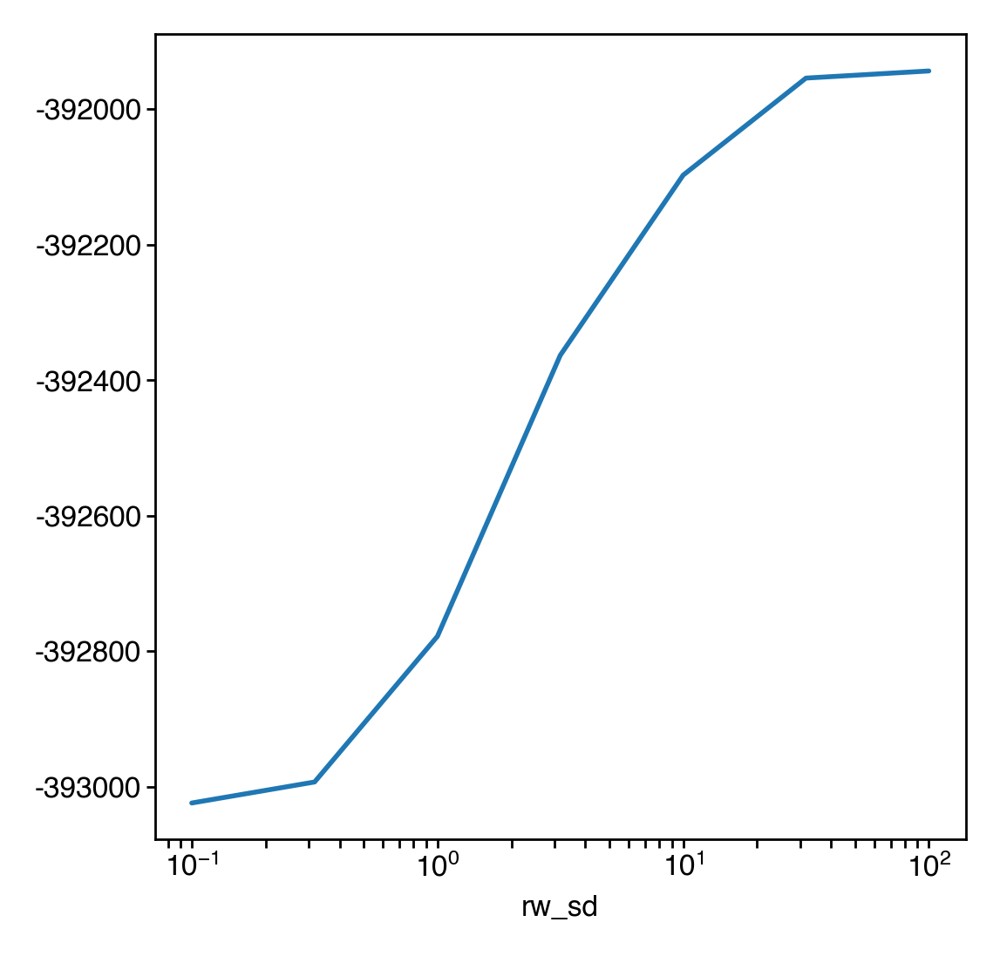

In [19]:
ax = out.groupby('rw_sd')['heldout_ll'].max().plot()
ax.set(xscale='log')

[None]

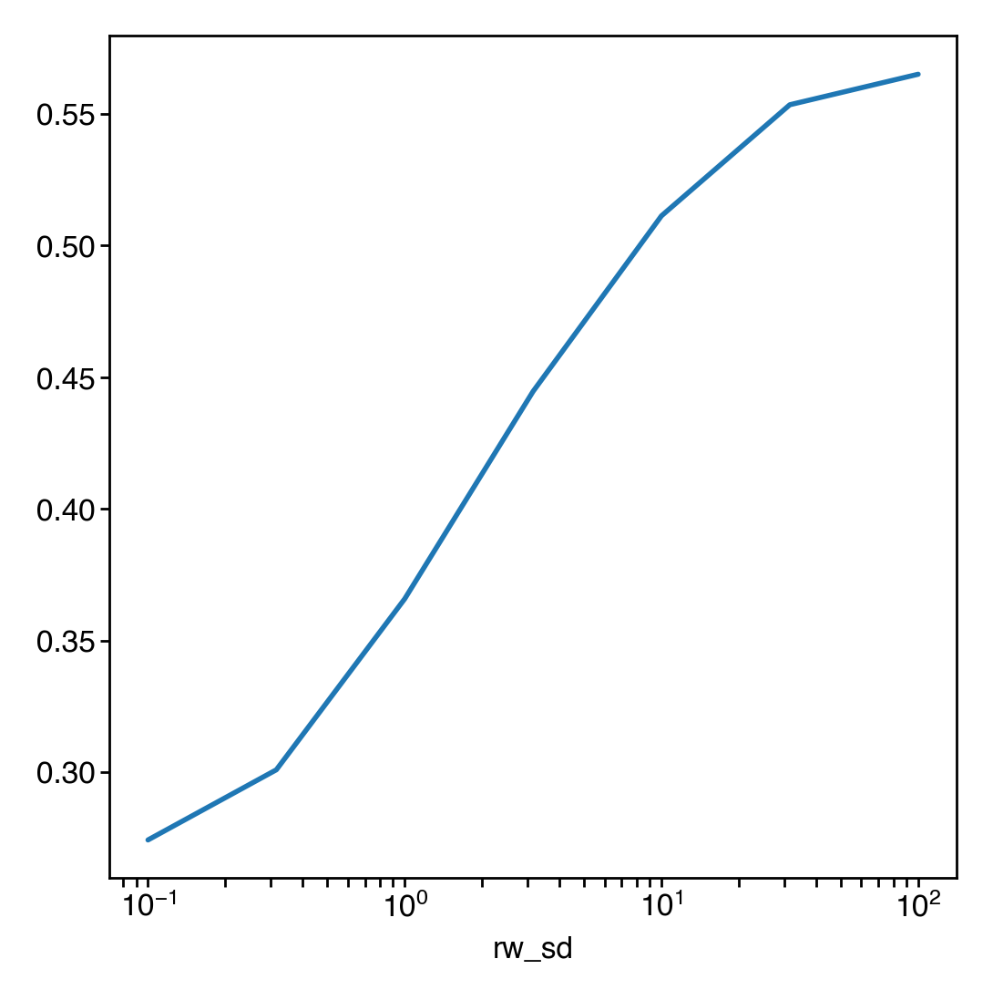

In [20]:
ax = out.groupby('rw_sd')['heldout_r2'].max().plot()
ax.set(xscale='log')

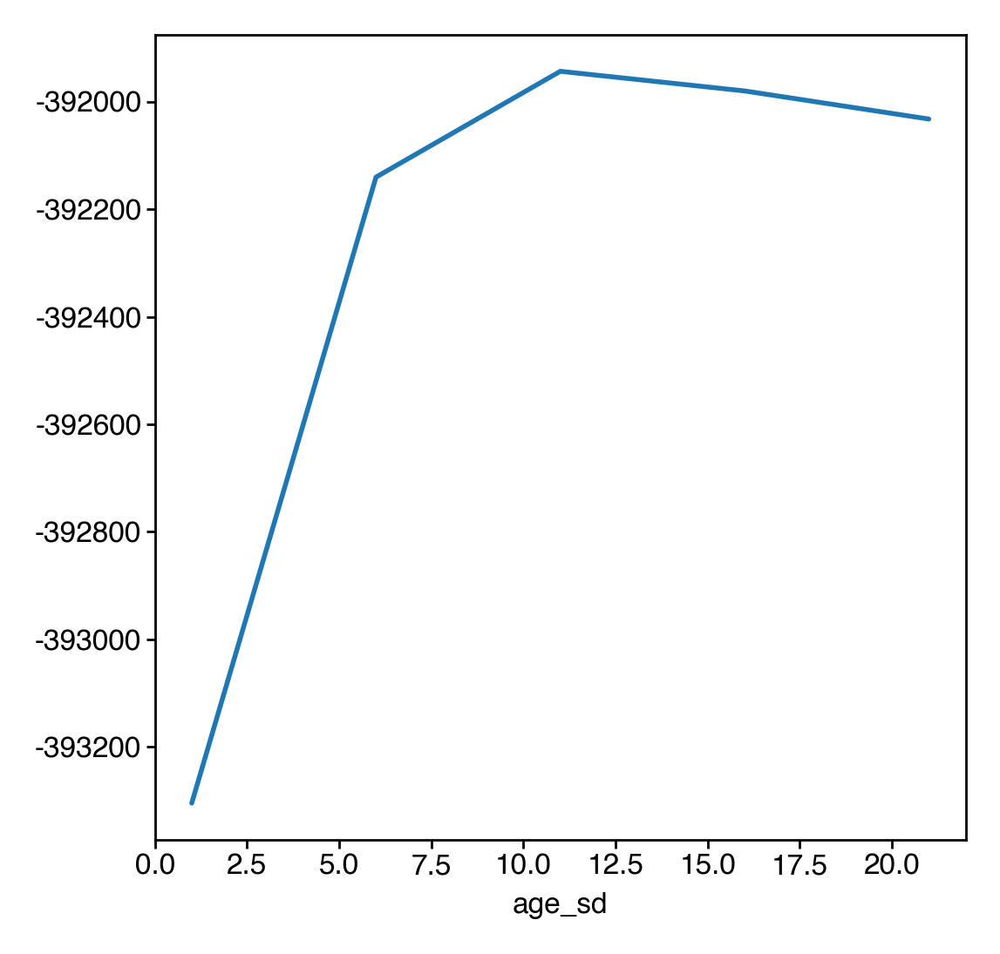

In [21]:
ax = out.groupby('age_sd')['heldout_ll'].max().plot()

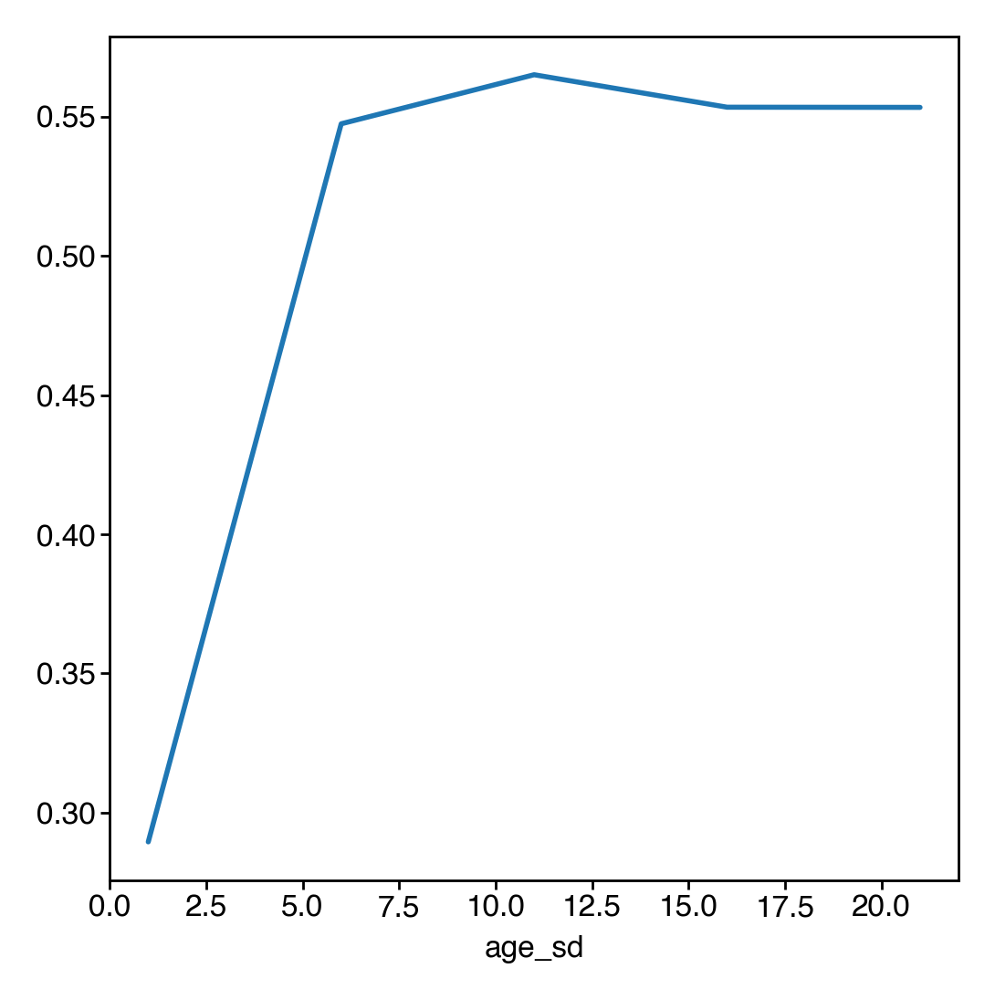

In [22]:
ax = out.groupby('age_sd')['heldout_r2'].max().plot()

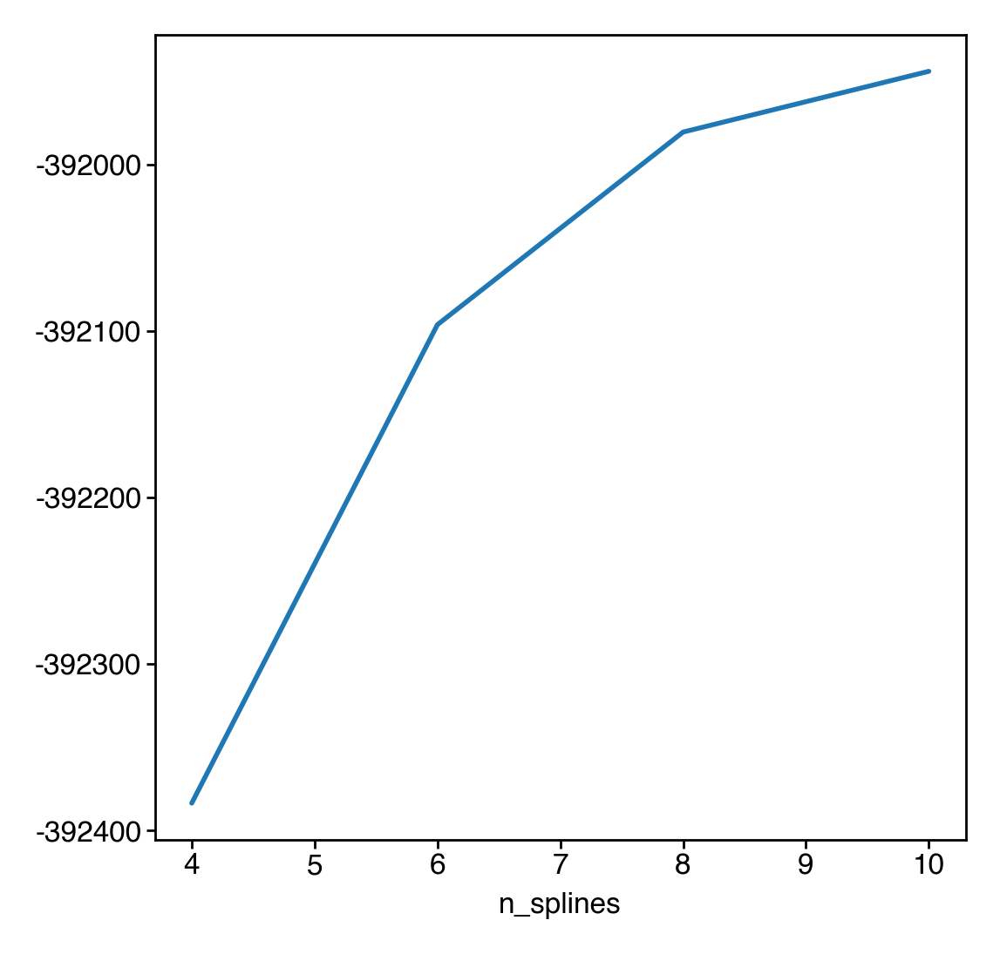

In [25]:
ax = out.groupby('n_splines')['heldout_ll'].max().plot()

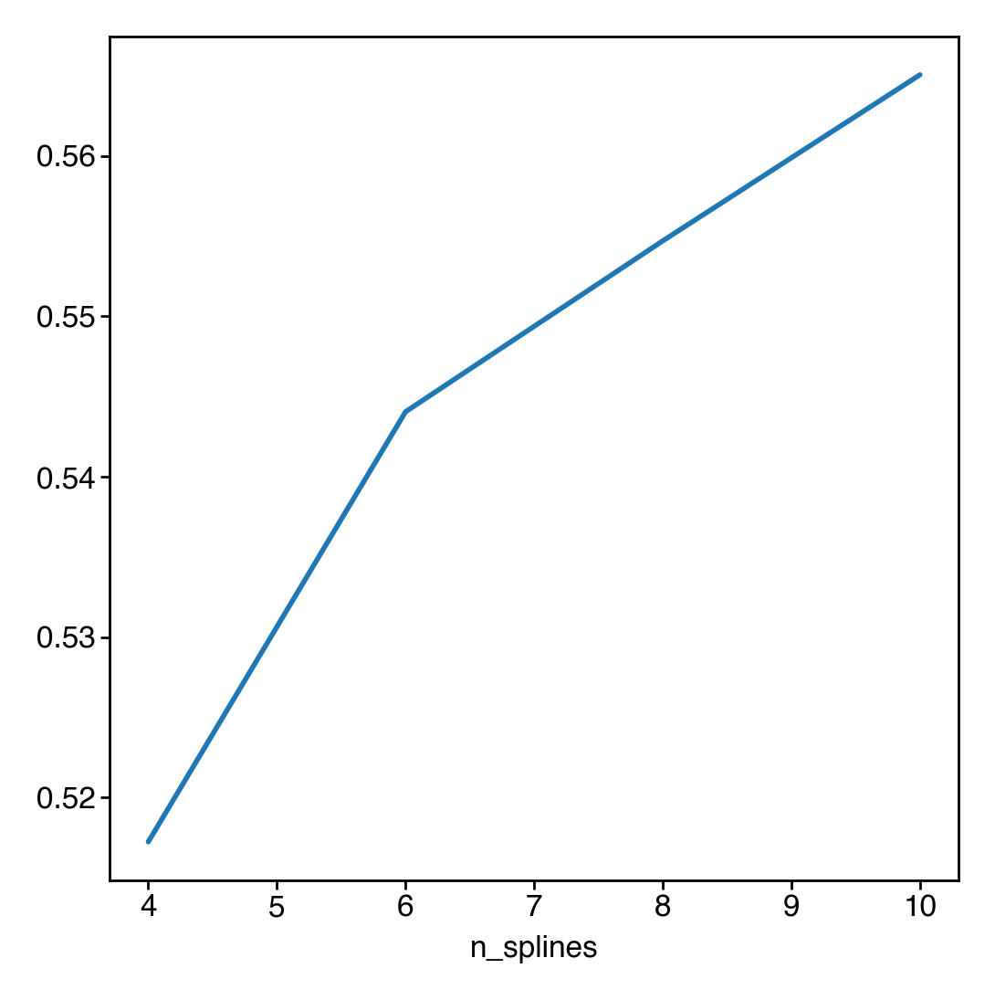

In [24]:
ax = out.groupby('n_splines')['heldout_r2'].max().plot()

In [26]:
out.sort_values(by='heldout_r2')

,age_sd,n_splines,rw_sd,param_norm,heldout_ll,heldout_r2
43,1.0,10,0.100000,5.790929,-394816.25,-0.253319
97,1.0,8,0.100000,4.329480,-394508.25,-0.164212
104,6.0,10,0.100000,4.168488,-394435.25,-0.137730
55,11.0,10,0.100000,3.820348,-394330.75,-0.119940
117,21.0,10,0.100000,4.194934,-394414.50,-0.109161
...,...,...,...,...,...,...
28,21.0,10,100.000000,6.787273,-392039.50,0.553342
91,16.0,8,100.000000,5.834962,-391980.25,0.553404
134,11.0,10,31.622777,6.422022,-391954.25,0.553484
118,11.0,8,100.000000,5.911709,-392002.25,0.554707


In [27]:
out.sort_values(by='heldout_ll')

,age_sd,n_splines,rw_sd,param_norm,heldout_ll,heldout_r2
43,1.0,10,0.100000,5.790929,-394816.25,-0.253319
97,1.0,8,0.100000,4.329480,-394508.25,-0.164212
104,6.0,10,0.100000,4.168488,-394435.25,-0.137730
117,21.0,10,0.100000,4.194934,-394414.50,-0.109161
27,16.0,10,0.100000,3.838381,-394363.50,-0.109132
...,...,...,...,...,...,...
71,11.0,8,31.622777,5.648776,-391999.00,0.544288
125,16.0,8,31.622777,5.629859,-391984.75,0.544580
91,16.0,8,100.000000,5.834962,-391980.25,0.553404
134,11.0,10,31.622777,6.422022,-391954.25,0.553484


<Axes: xlabel='age_sd', ylabel='n_splines'>

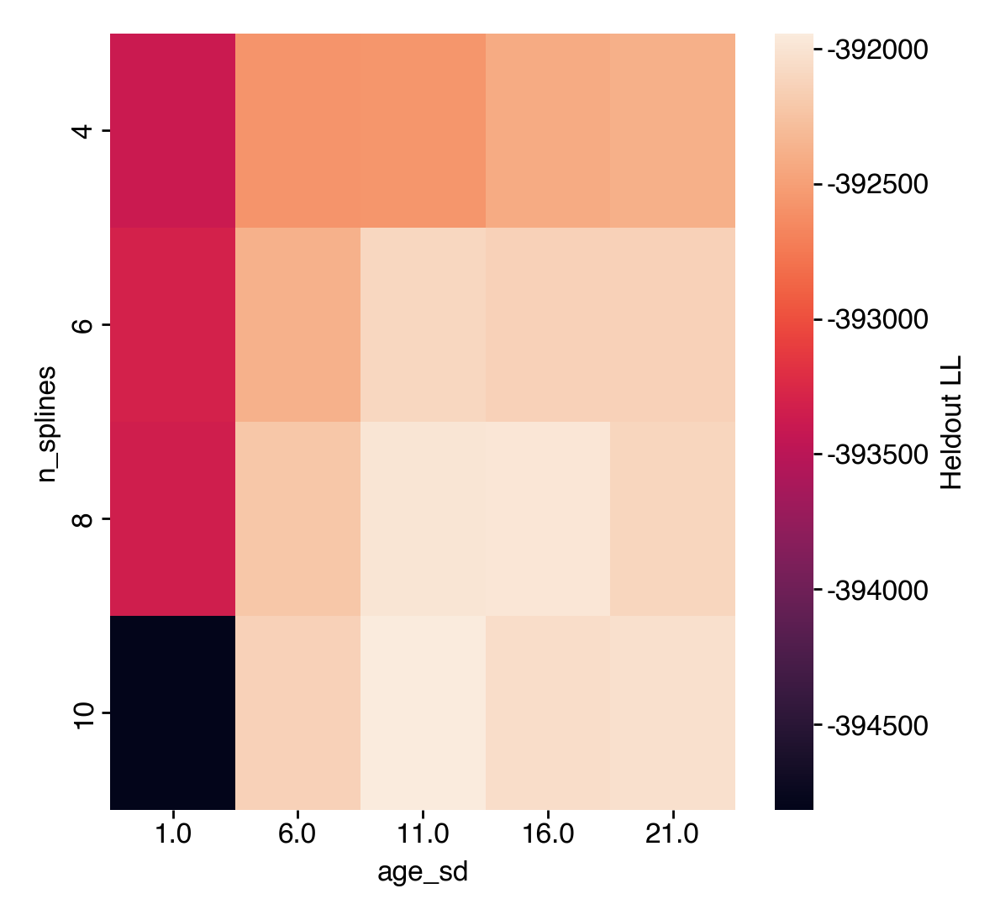

In [28]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='n_splines', values='heldout_ll', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='age_sd', ylabel='n_splines'>

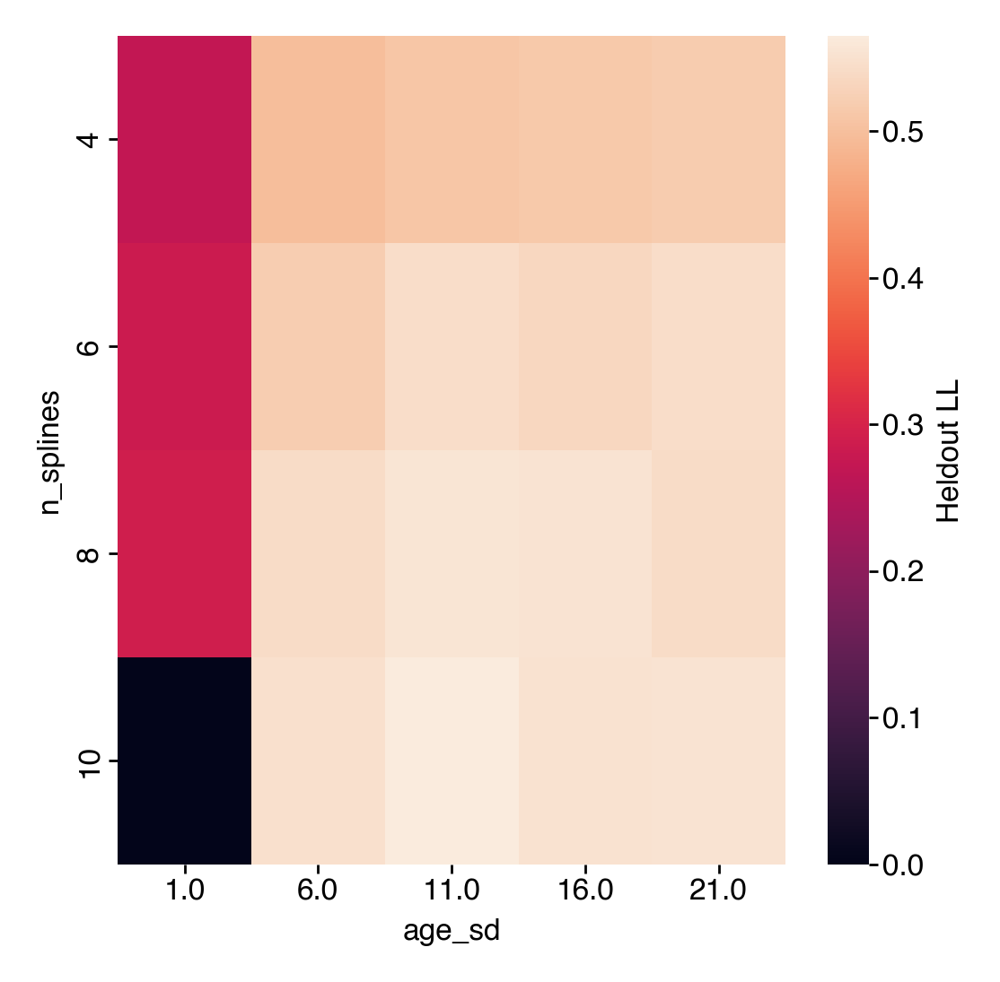

In [29]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='n_splines', values='heldout_r2', aggfunc='max'), cbar_kws=dict(label="Heldout LL"), vmin=0)

<Axes: xlabel='age_sd', ylabel='rw_sd'>

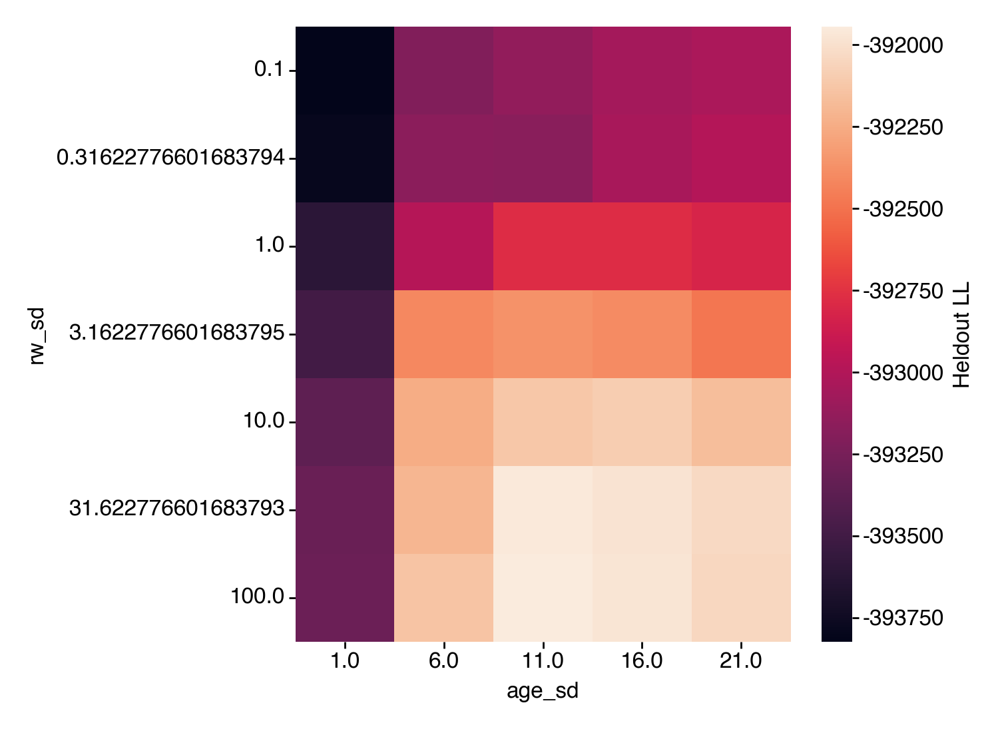

In [30]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='rw_sd', values='heldout_ll', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='n_splines', ylabel='rw_sd'>

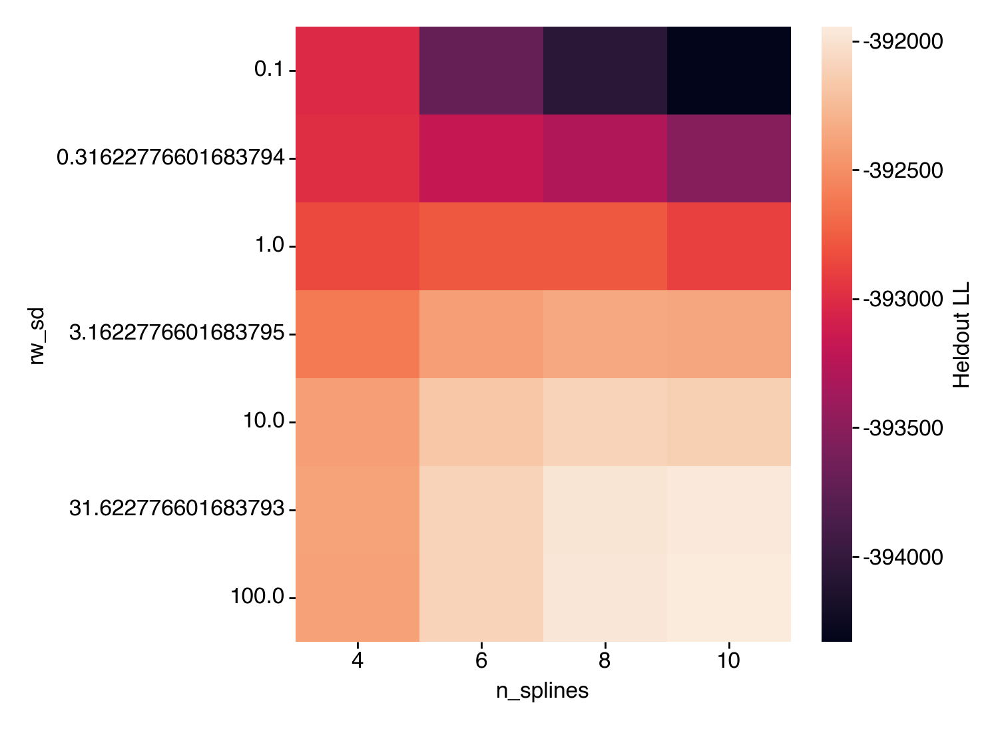

In [31]:
sns.heatmap(pd.pivot_table(out, columns='n_splines', index='rw_sd', values='heldout_ll', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

In [34]:
files = sorted(Path('/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior').glob('ontogeny-gridsearch-2*.p'))

In [42]:
# find a specific parameter set
param_set = dict(
    age_sd=6,
    n_splines=8,
    rw_sd=3.16,
)
for f in tqdm(files):
    tmp = joblib.load(f)
    matches = []
    for k, v in tmp['grid_params'].items():
        matches.append(param_set[k] == round(v, 2))
    if all(matches):
        break

  0%|          | 0/140 [00:00<?, ?it/s]

In [43]:
tmp['grid_params']

{'age_sd': 6.0, 'n_splines': 8, 'rw_sd': 3.1622776601683795}

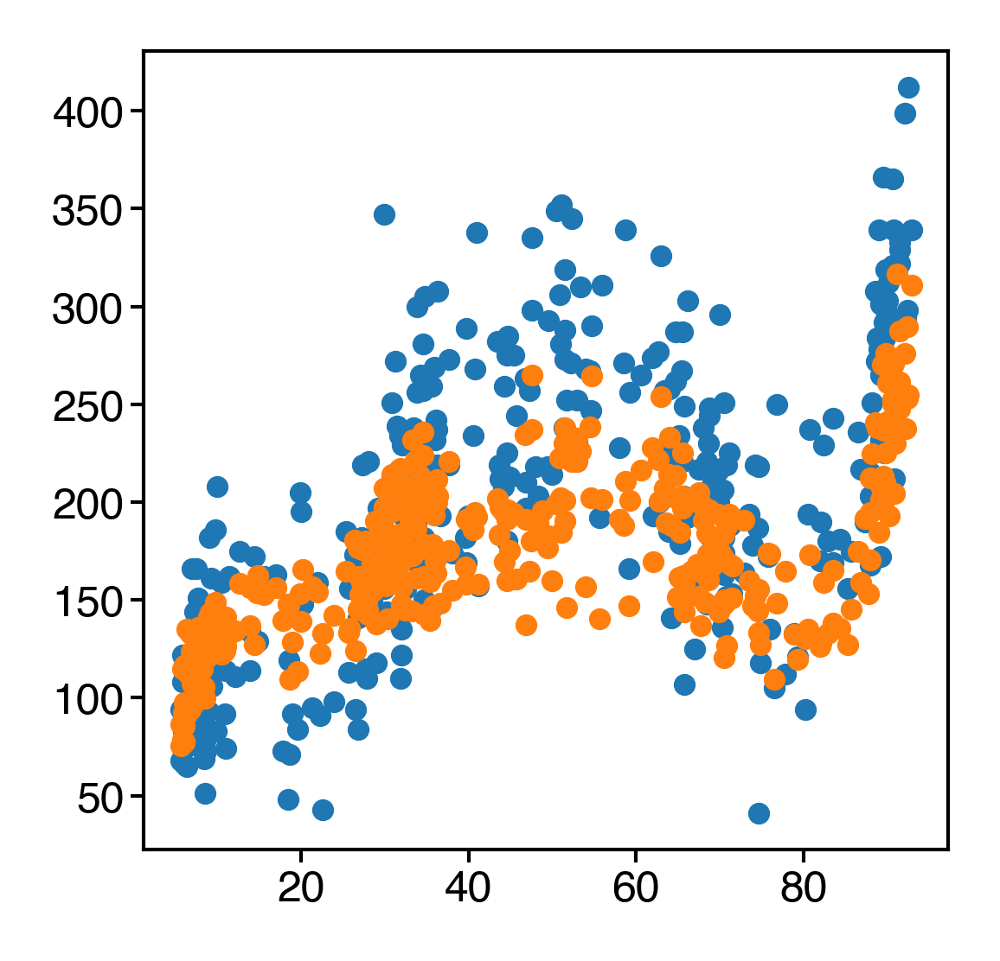

In [44]:
ba = tmp[0]['bio_ages']
ca = tmp[0]['true_ages']
pc = tmp[0]['predicted_counts'][:, 0]
c = tmp[0]['counts'][:, 0]
figure(2, 2)
plt.scatter(ba, c, s=5)
plt.scatter(ba, pc, s=5)

## Set age sd, high def scan of rw_prior and n_splines

In [47]:
rw_prior = np.linspace(0.5, 10, 17)

age_sd = range(7, 12, 2)

n_splines = range(4, 10)

In [76]:
random.seed(0)
grid = list(product(n_splines, age_sd, rw_prior))
random.shuffle(grid)

out = []
for i, (_n_splines, _age_sd, _rw_prior) in enumerate(tqdm(grid)):
    hypparams["n_splines"] = _n_splines
    hypparams["age_sd"] = float(_age_sd)
    hypparams["rw_sd"] = float(_rw_prior)
    try:
        tmp = masked_xval(features, hypparams, 2, n_repeats=3, disable_tqdm=True)
        for v in tmp.values():
            v["init_components"].age_normalizer = None
            v["init_components"].age_unnormalizer = None
        tmp["grid_params"] = keyfilter(
            lambda k: k in ["n_splines", "age_sd", "rw_sd"], hypparams
        )
        joblib.dump(
            tmp,
            f"/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior/ontogeny-gridsearch-high-definition-2024-04-10-iter-{i:03d}.p",
        )
        heldout_ll = list(
            pluck("heldout_ll", keyfilter(lambda k: isinstance(k, int), tmp).values())
        )
        heldout_ll = np.mean(heldout_ll)
        heldout_r2 = list(
            pluck(
                "heldout_r2_total_v3", keyfilter(lambda k: isinstance(k, int), tmp).values()
            )
        )
        heldout_r2 = np.mean(heldout_r2)
        param_norm = np.mean(
            [
                np.linalg.norm(v["params"]["bio_basis_weights"], axis=1).mean()
                for v in keyfilter(lambda k: isinstance(k, int), tmp).values()
            ]
        )
        out.append(
            {
                **tmp["grid_params"],
                "param_norm": param_norm,
                "heldout_ll": heldout_ll,
                "heldout_r2": heldout_r2,
            }
        )
        if out[-1]['heldout_r2'] > 0.2:
            print(i, out[-1])
    except ValueError:
        continue
out = pd.DataFrame(out)

  0%|          | 0/306 [00:00<?, ?it/s]

171 {'age_sd': 11.0, 'n_splines': 4, 'rw_sd': 5.84375, 'param_norm': 3.7928667, 'heldout_ll': -392675.3333333333, 'heldout_r2': 0.468397973359084}
172 {'age_sd': 11.0, 'n_splines': 5, 'rw_sd': 6.4375, 'param_norm': 4.876572, 'heldout_ll': -392307.3333333333, 'heldout_r2': 0.4970195055386301}
173 {'age_sd': 7.0, 'n_splines': 5, 'rw_sd': 3.46875, 'param_norm': 5.19705, 'heldout_ll': -392659.3333333333, 'heldout_r2': 0.43569720275828594}
174 {'age_sd': 11.0, 'n_splines': 9, 'rw_sd': 4.65625, 'param_norm': 6.6239114, 'heldout_ll': -392238.6666666667, 'heldout_r2': 0.47493497757193187}
175 {'age_sd': 9.0, 'n_splines': 5, 'rw_sd': 1.09375, 'param_norm': 5.037511, 'heldout_ll': -392757.3333333333, 'heldout_r2': 0.3630929130643892}
176 {'age_sd': 7.0, 'n_splines': 4, 'rw_sd': 2.875, 'param_norm': 5.204896, 'heldout_ll': -392664.6666666667, 'heldout_r2': 0.4259628623984588}
177 {'age_sd': 7.0, 'n_splines': 5, 'rw_sd': 7.03125, 'param_norm': 5.126876, 'heldout_ll': -392480.0, 'heldout_r2': 0.489

In [77]:
files = sorted(Path('/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior').glob('ontogeny-gridsearch-high-definition*.p'))

In [78]:
out = []
for file in tqdm(files):
    tmp = joblib.load(file)
    heldout_ll = list(
        pluck("heldout_ll", keyfilter(lambda k: isinstance(k, int), tmp).values())
    )
    heldout_ll = np.mean(heldout_ll)
    heldout_r2 = list(
        pluck(
            "heldout_r2_total_v3", keyfilter(lambda k: isinstance(k, int), tmp).values()
        )
    )
    heldout_r2 = np.mean(heldout_r2)
    param_norm = np.mean(
        [
            np.linalg.norm(v["params"]["bio_basis_weights"], axis=1).mean()
            for v in keyfilter(lambda k: isinstance(k, int), tmp).values()
        ]
    )
    out.append(
        {
            **tmp["grid_params"],
            "param_norm": param_norm,
            "heldout_ll": heldout_ll,
            "heldout_r2": heldout_r2,
        }
    )
out = pd.DataFrame(out)

  0%|          | 0/306 [00:00<?, ?it/s]

<Axes: xlabel='n_splines', ylabel='rw_sd'>

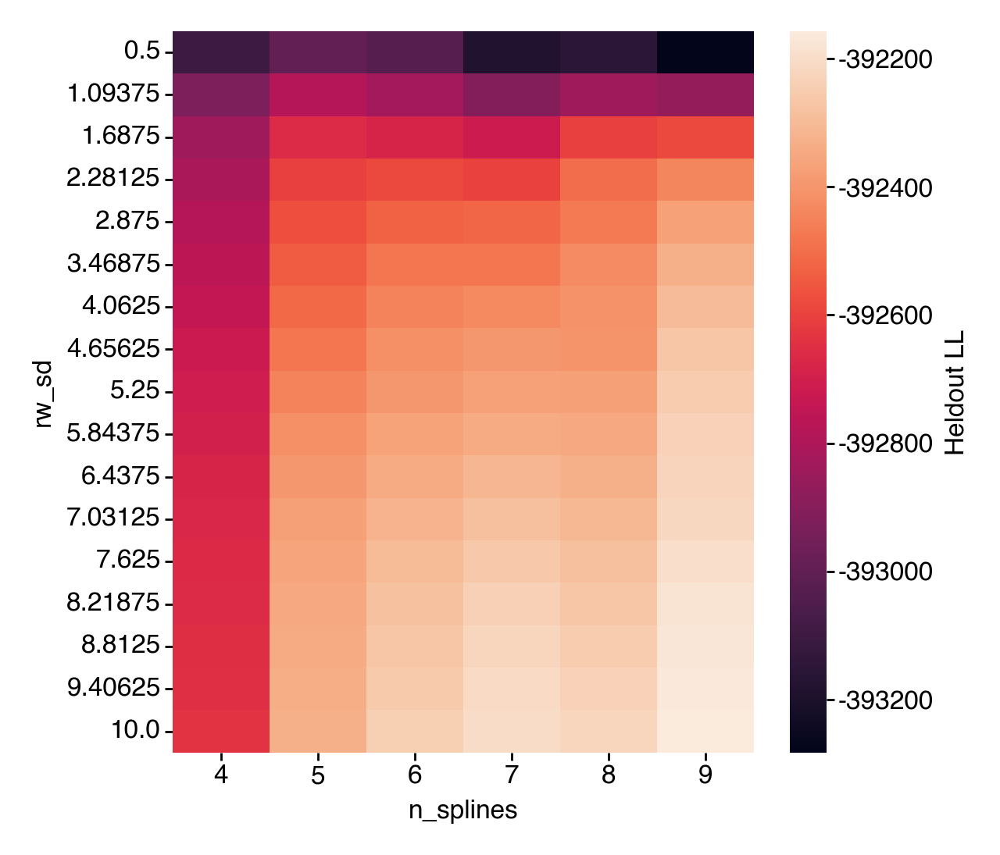

In [79]:
sns.heatmap(pd.pivot_table(out, columns='n_splines', index='rw_sd', values='heldout_ll', aggfunc='mean'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='age_sd', ylabel='rw_sd'>

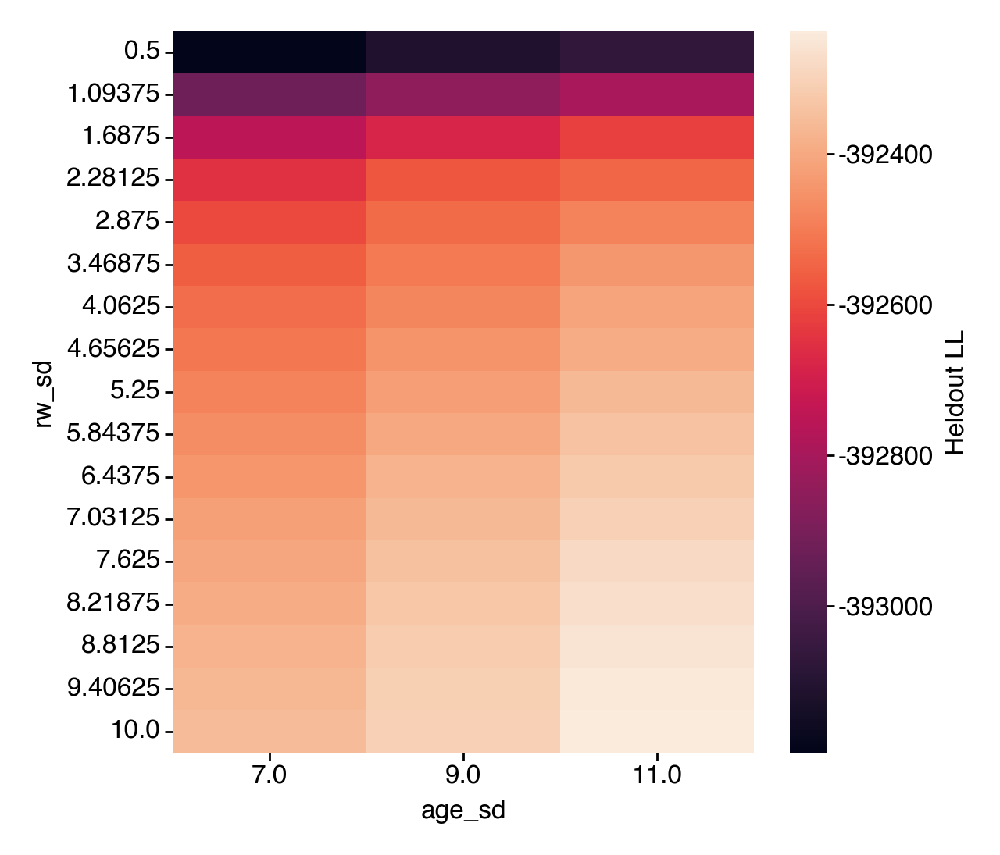

In [80]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='rw_sd', values='heldout_ll', aggfunc='mean'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='age_sd', ylabel='n_splines'>

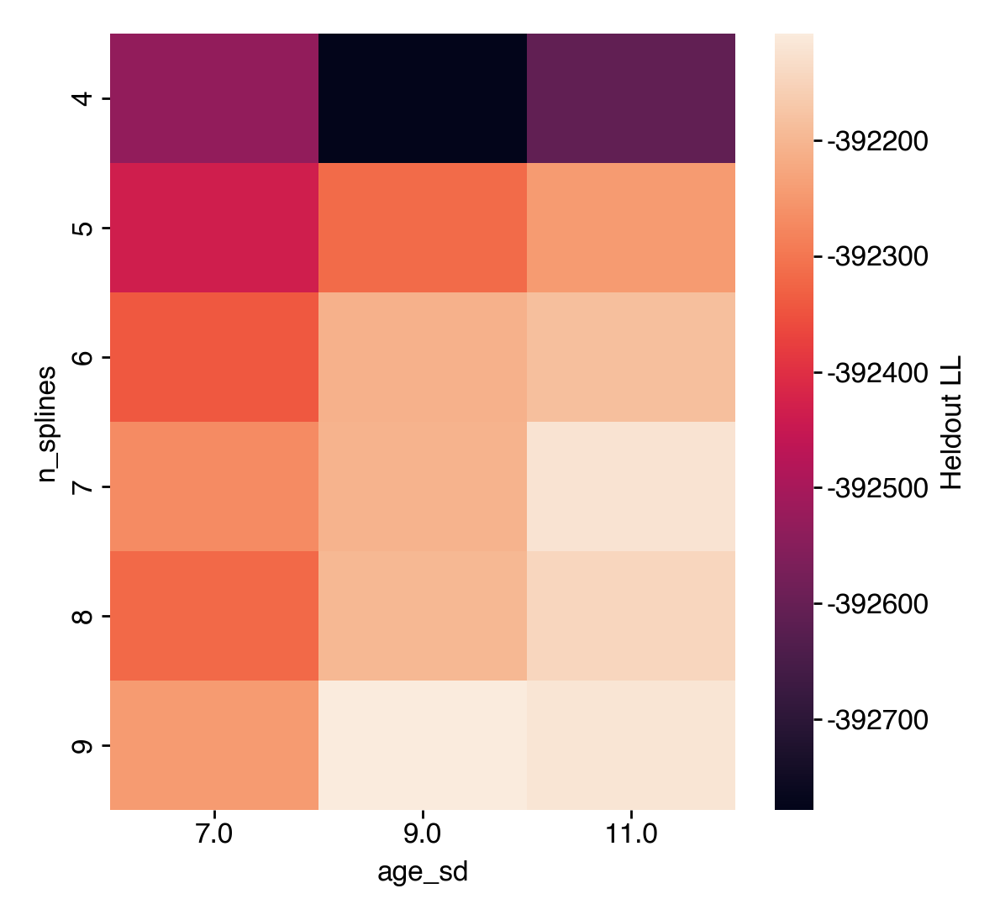

In [81]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='n_splines', values='heldout_ll', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='age_sd', ylabel='n_splines'>

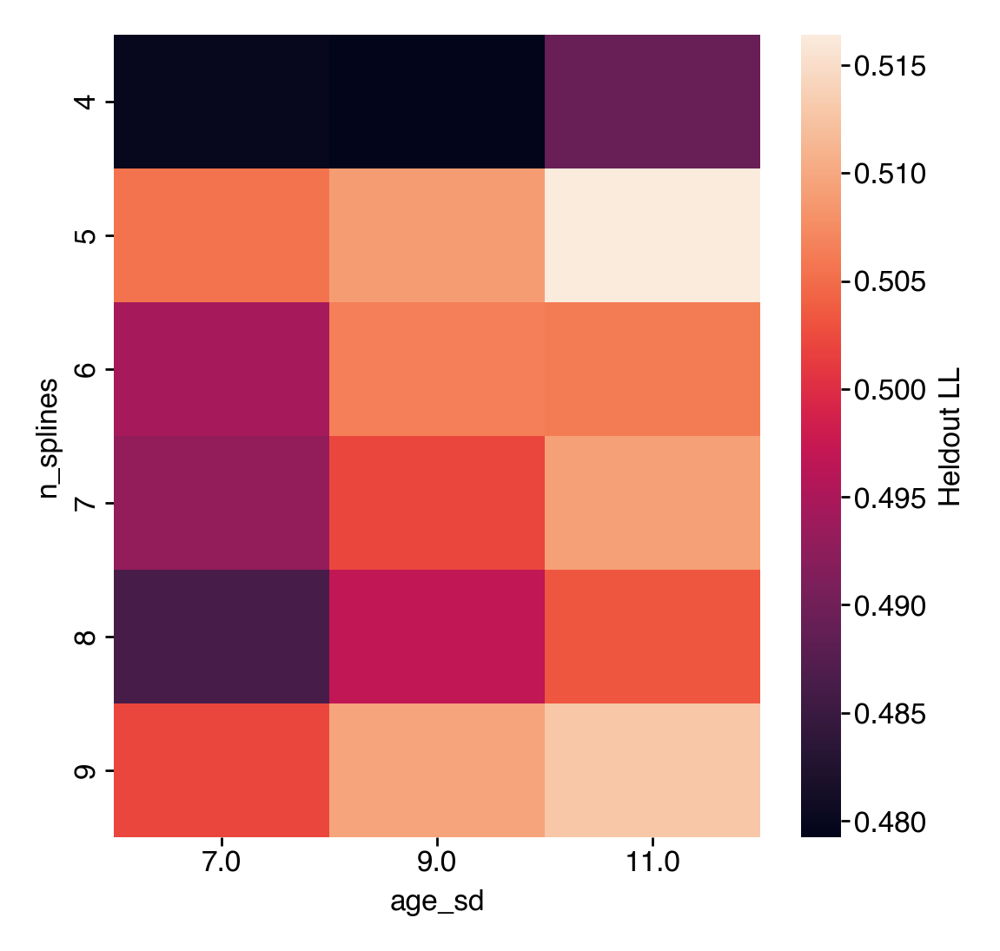

In [82]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='n_splines', values='heldout_r2', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='age_sd', ylabel='rw_sd'>

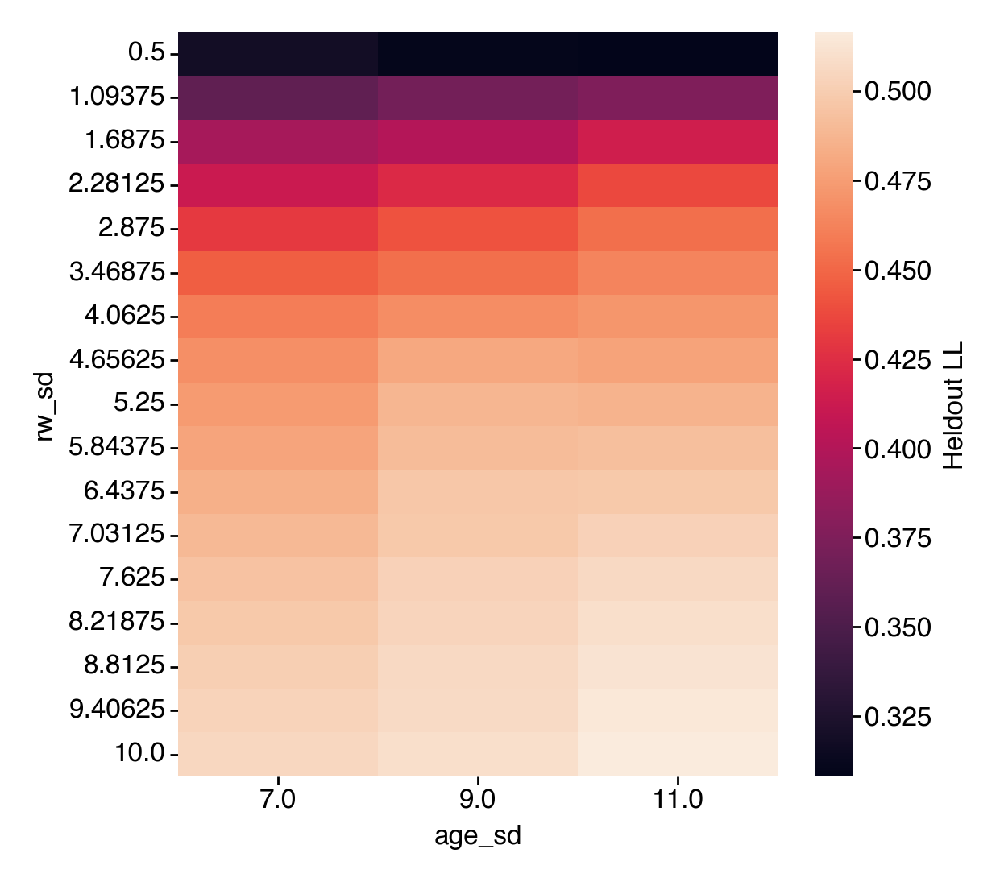

In [83]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='rw_sd', values='heldout_r2', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='n_splines', ylabel='rw_sd'>

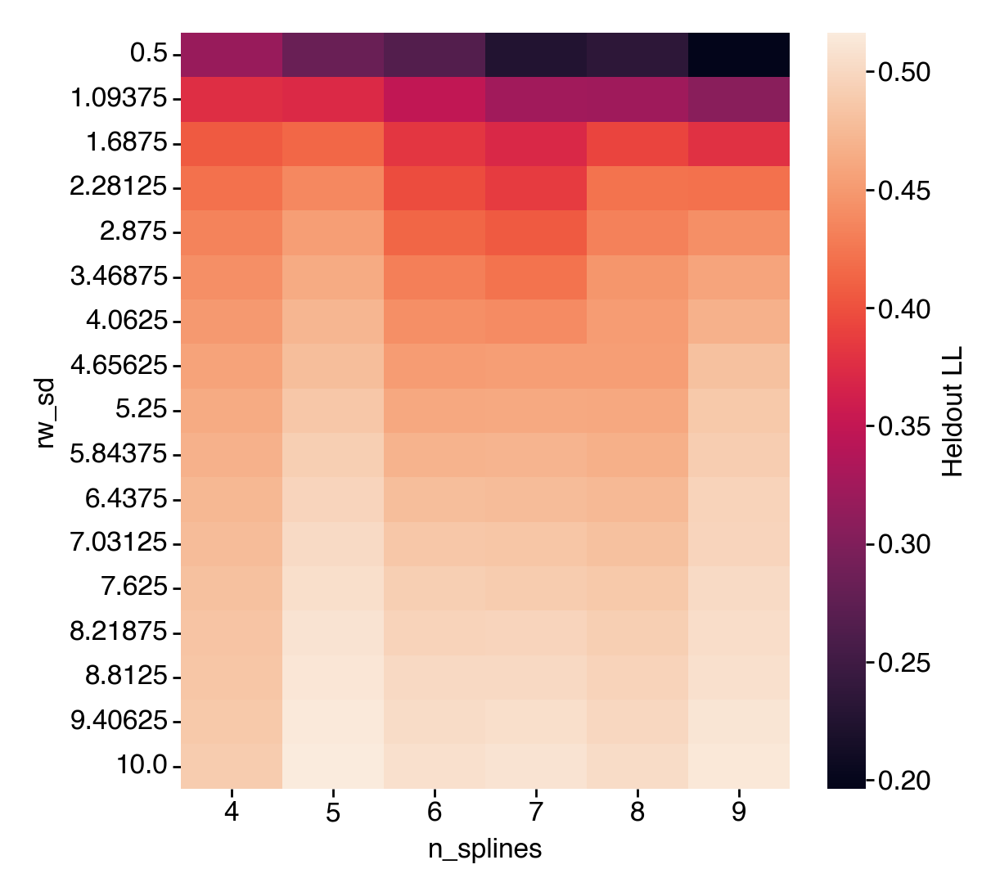

In [84]:
sns.heatmap(pd.pivot_table(out, columns='n_splines', index='rw_sd', values='heldout_r2', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))

<Axes: xlabel='rw_sd'>

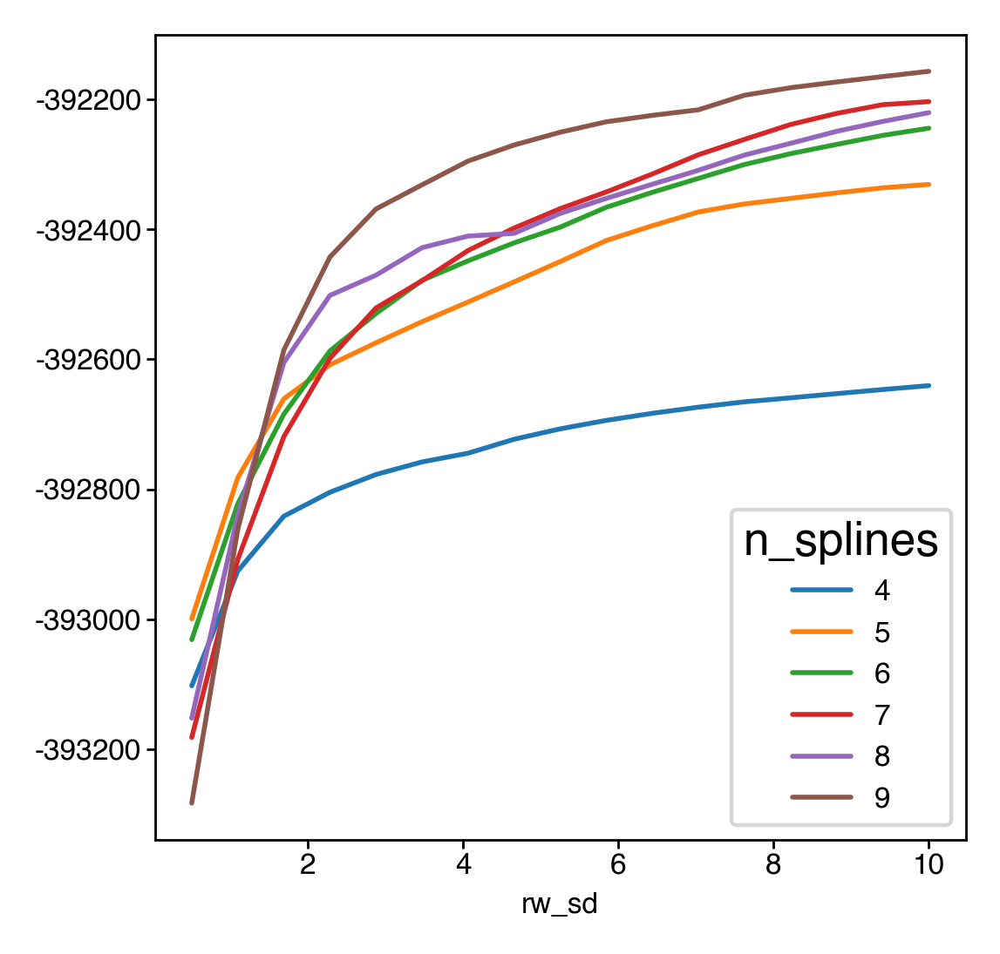

In [85]:
to_plt = pd.pivot_table(out, columns='n_splines', index='rw_sd', values='heldout_ll', aggfunc='mean').interpolate()
to_plt.plot()

<Axes: xlabel='rw_sd'>

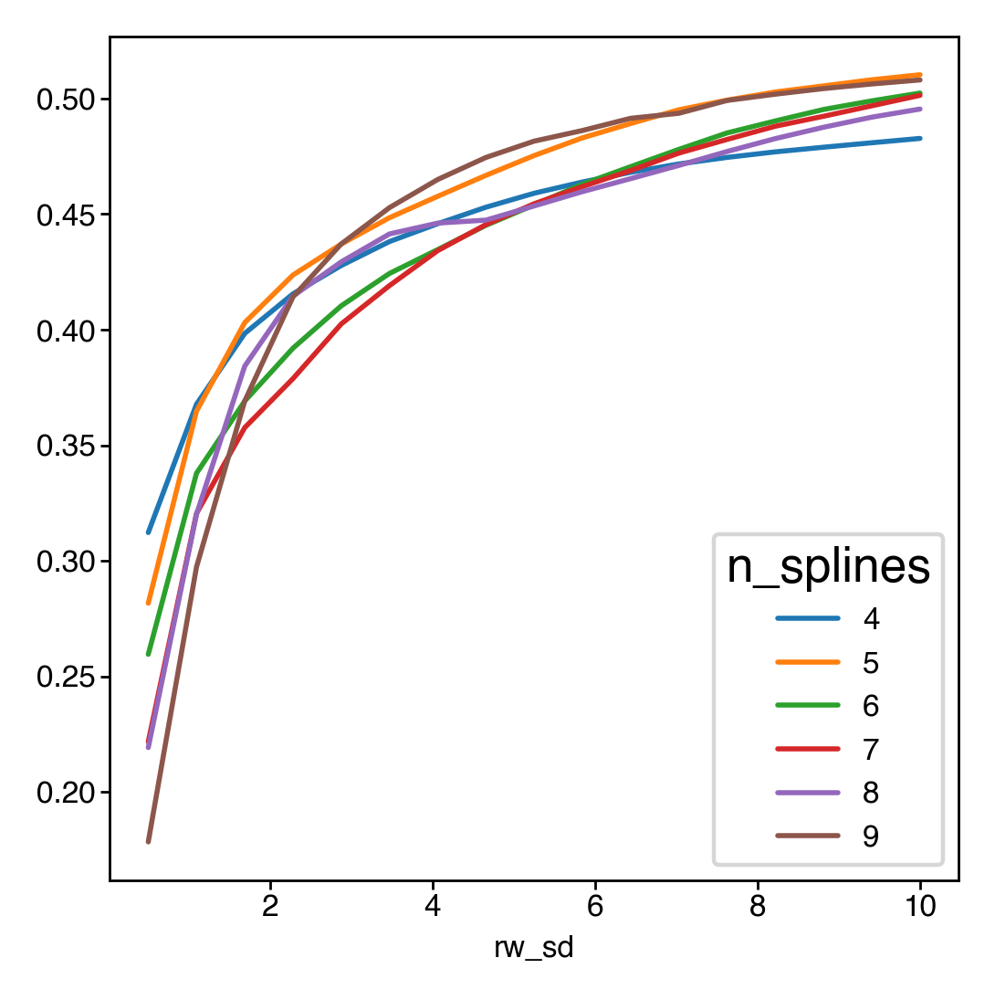

In [86]:
to_plt = pd.pivot_table(out, columns='n_splines', index='rw_sd', values='heldout_r2', aggfunc='mean').interpolate()
to_plt.plot()

In [87]:
to_plt

n_splines,4,5,6,7,8,9
rw_sd,,,,,,
0.50000,0.312242,0.281678,0.259561,0.221753,0.219219,0.178418
1.09375,0.367762,0.364757,0.337889,0.320523,0.320099,0.297359
1.68750,0.398395,0.403087,0.369127,0.357646,0.384248,0.369154
2.28125,0.415503,0.423659,0.392009,0.378831,0.414518,0.414217
2.87500,0.427759,0.437058,0.410308,0.402471,0.429337,0.437096
3.46875,0.438131,0.448450,0.424327,0.419069,0.441426,0.452800
4.06250,0.445851,0.457711,0.434648,0.434208,0.446118,0.464978
4.65625,0.452993,0.466778,0.445163,0.445480,0.447414,0.474527
5.25000,0.459037,0.475342,0.453990,0.454493,0.453547,0.481582


<Axes: xlabel='rw_sd'>

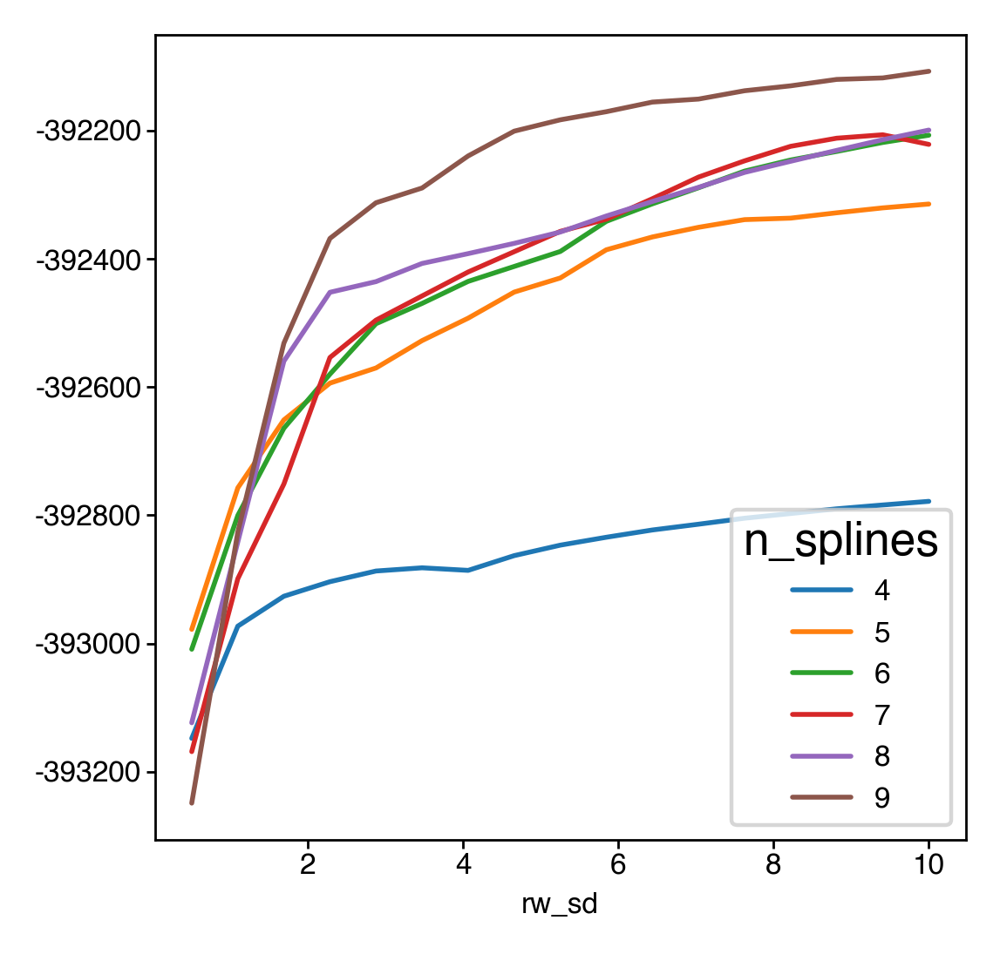

In [88]:
to_plt = pd.pivot_table(out.query('age_sd == 9'), columns='n_splines', index='rw_sd', values='heldout_ll', aggfunc='mean').interpolate()
to_plt.plot()

<Axes: xlabel='rw_sd'>

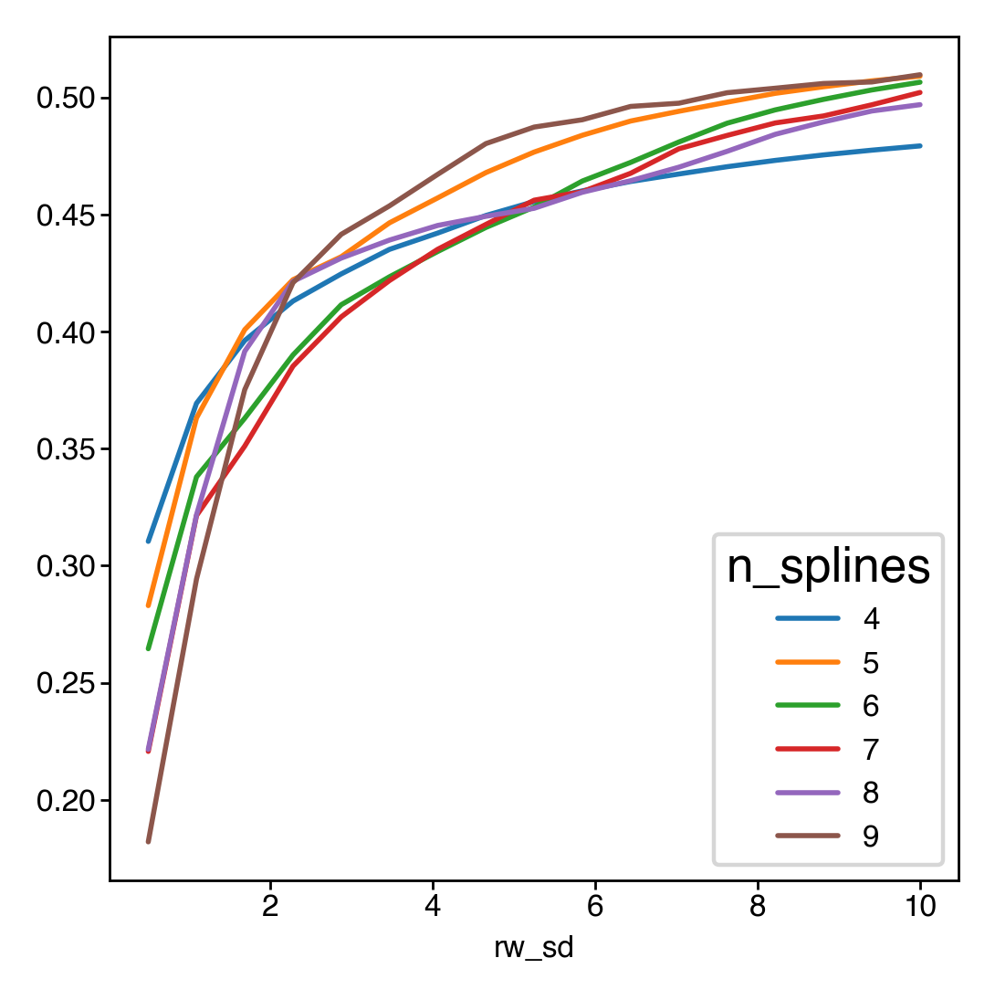

In [89]:
to_plt = pd.pivot_table(out.query('age_sd == 9'), columns='n_splines', index='rw_sd', values='heldout_r2', aggfunc='mean').interpolate()
to_plt.plot()

In [90]:
to_plt

n_splines,4,5,6,7,8,9
rw_sd,,,,,,
0.50000,0.310399,0.282976,0.264564,0.220730,0.221608,0.182108
1.09375,0.369355,0.363093,0.337939,0.321408,0.321747,0.294310
1.68750,0.396148,0.400798,0.362981,0.351076,0.391539,0.375177
2.28125,0.412978,0.422126,0.389972,0.385200,0.421415,0.420818
2.87500,0.424578,0.431909,0.411424,0.406232,0.431333,0.441483
3.46875,0.435061,0.446391,0.423355,0.421752,0.439028,0.453628
4.06250,0.442024,0.457035,0.434142,0.435101,0.445277,0.467089
4.65625,0.449539,0.467846,0.444421,0.445718,0.449190,0.480232
5.25000,0.455491,0.476612,0.453136,0.456066,0.452603,0.487284


In [94]:
_rw_sd = to_plt.index[7]

<Axes: xlabel='n_splines'>

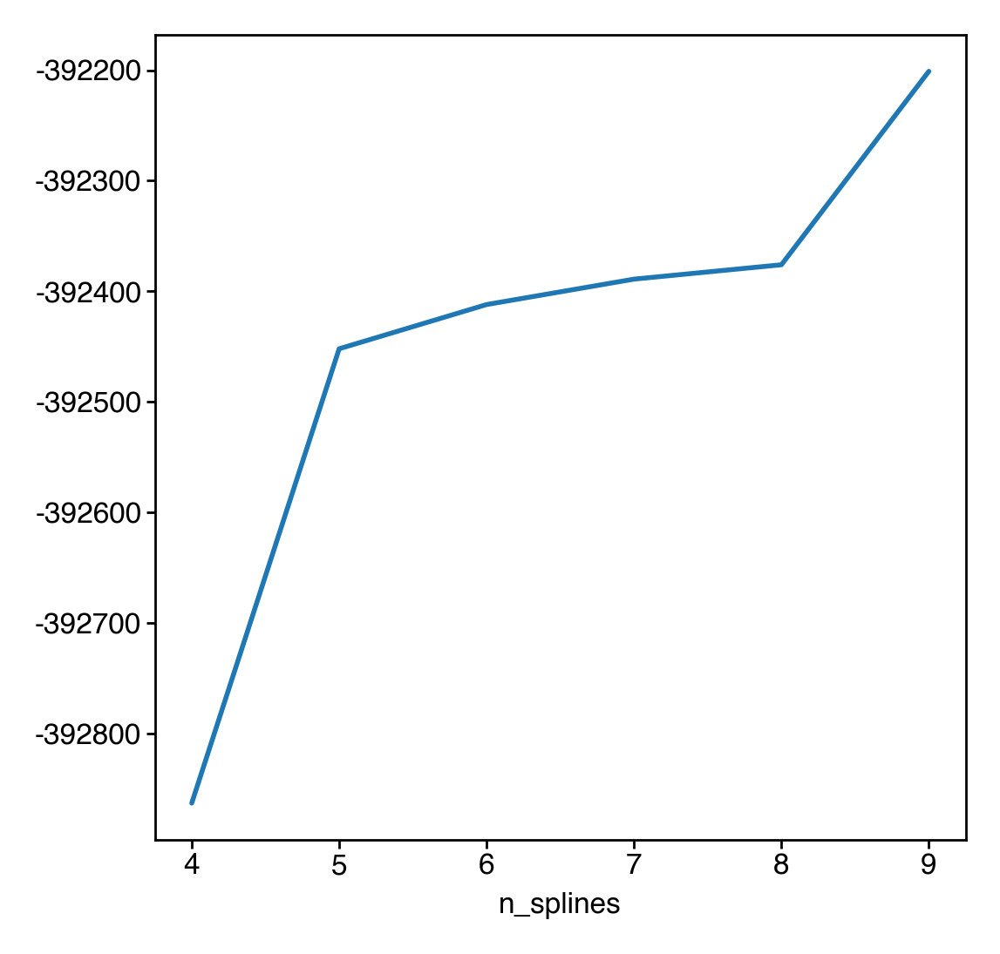

In [95]:
out.query('age_sd == 9 & rw_sd == @_rw_sd').set_index('n_splines').sort_index()['heldout_ll'].plot()

<Axes: xlabel='n_splines'>

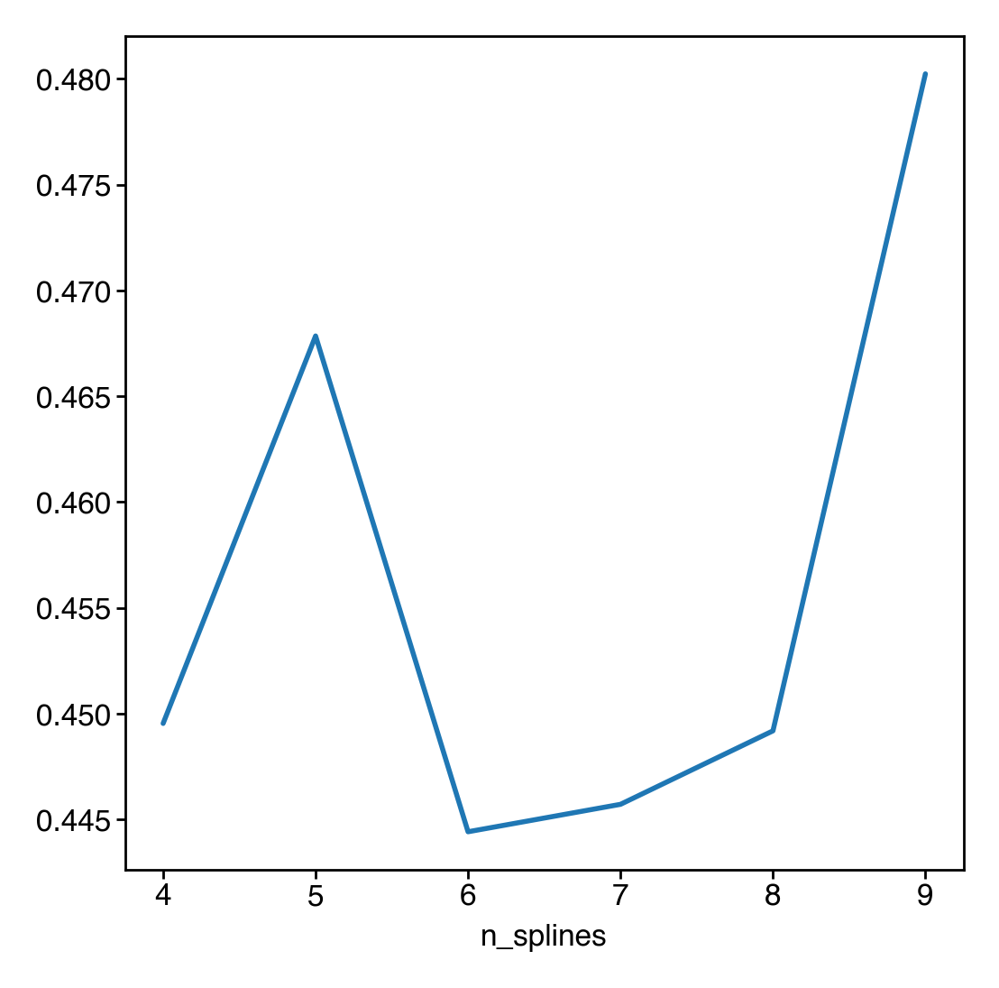

In [96]:
out.query('age_sd == 9 & rw_sd == @_rw_sd').set_index('n_splines').sort_index()['heldout_r2'].plot()

In [97]:
out.set_index('rw_sd').sort_index().query('n_splines == 6')['heldout_ll'].idxmax()

10.0

In [98]:
out.set_index('rw_sd').sort_index().query('n_splines == 8')['heldout_ll'].idxmax()

10.0

<Axes: xlabel='rw_sd'>

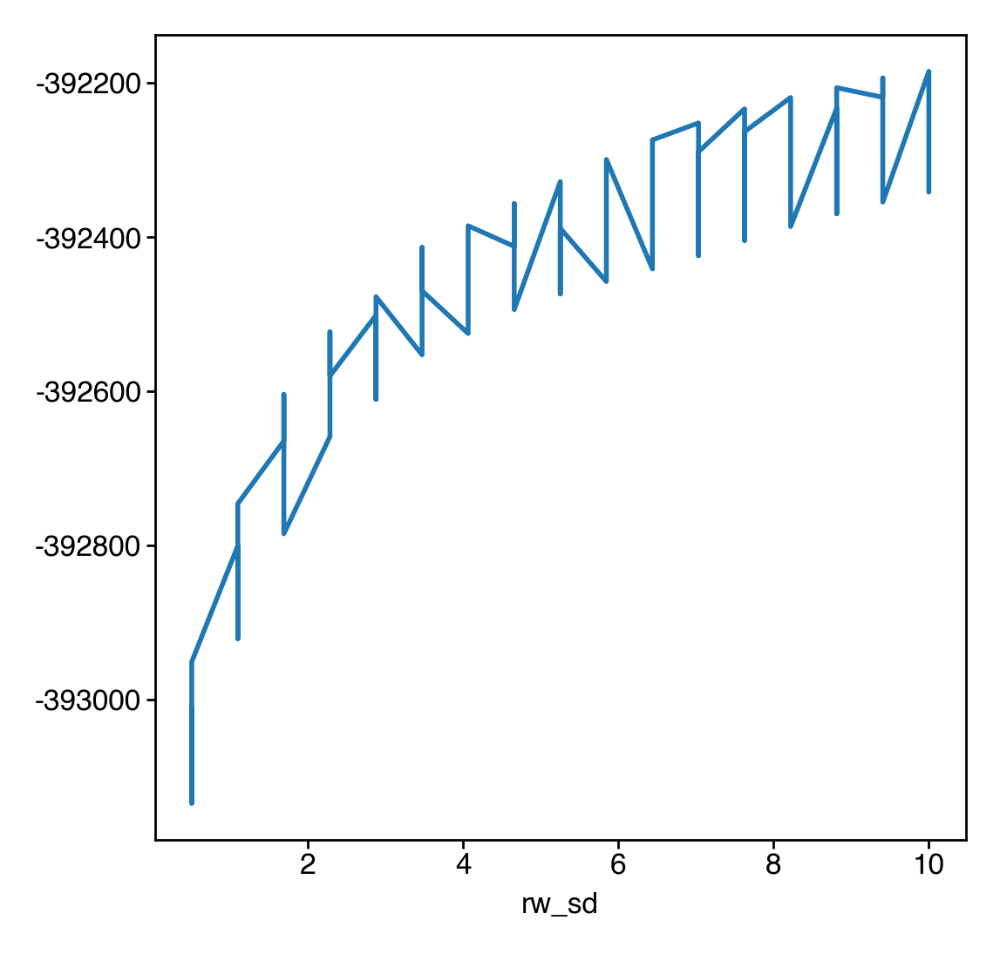

In [99]:
out.set_index('rw_sd').sort_index().query('n_splines == 6')['heldout_ll'].plot()

<Axes: xlabel='rw_sd'>

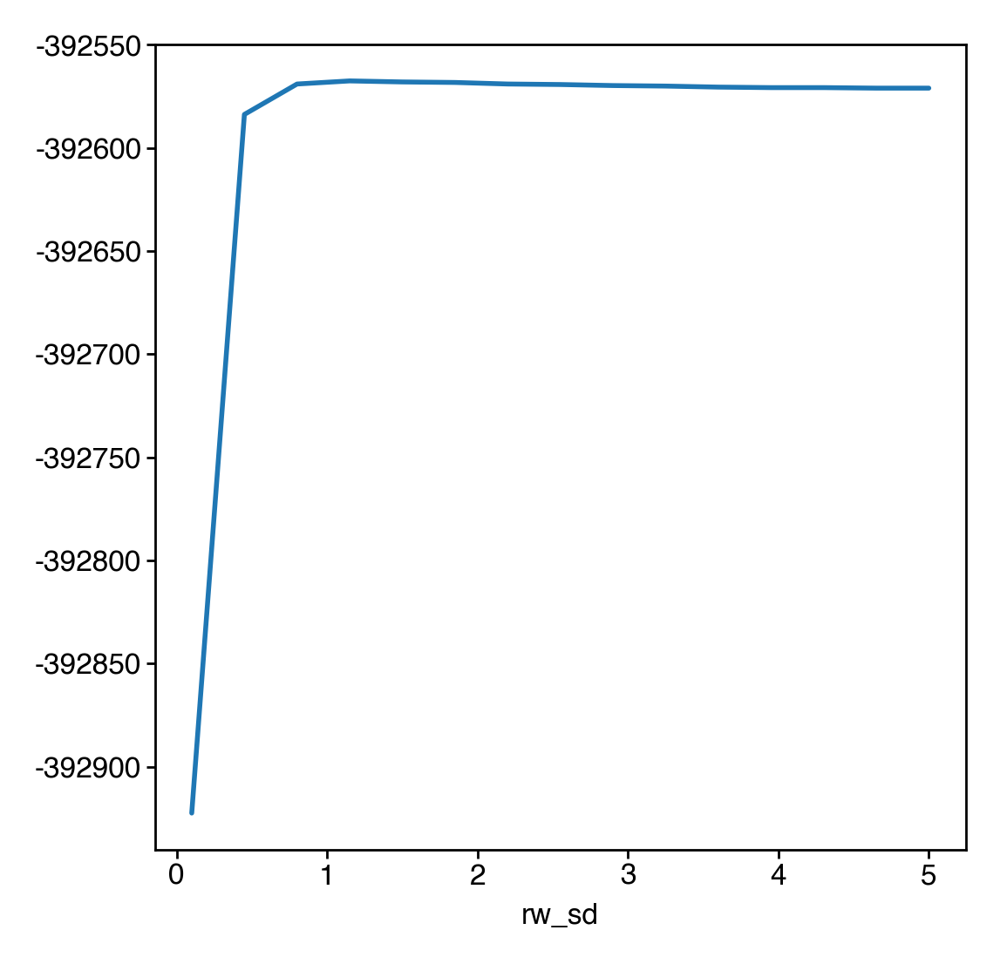

In [13]:
out.set_index('rw_sd').sort_index().query('n_splines == 4')['heldout_ll'].plot()

<Axes: xlabel='rw_sd'>

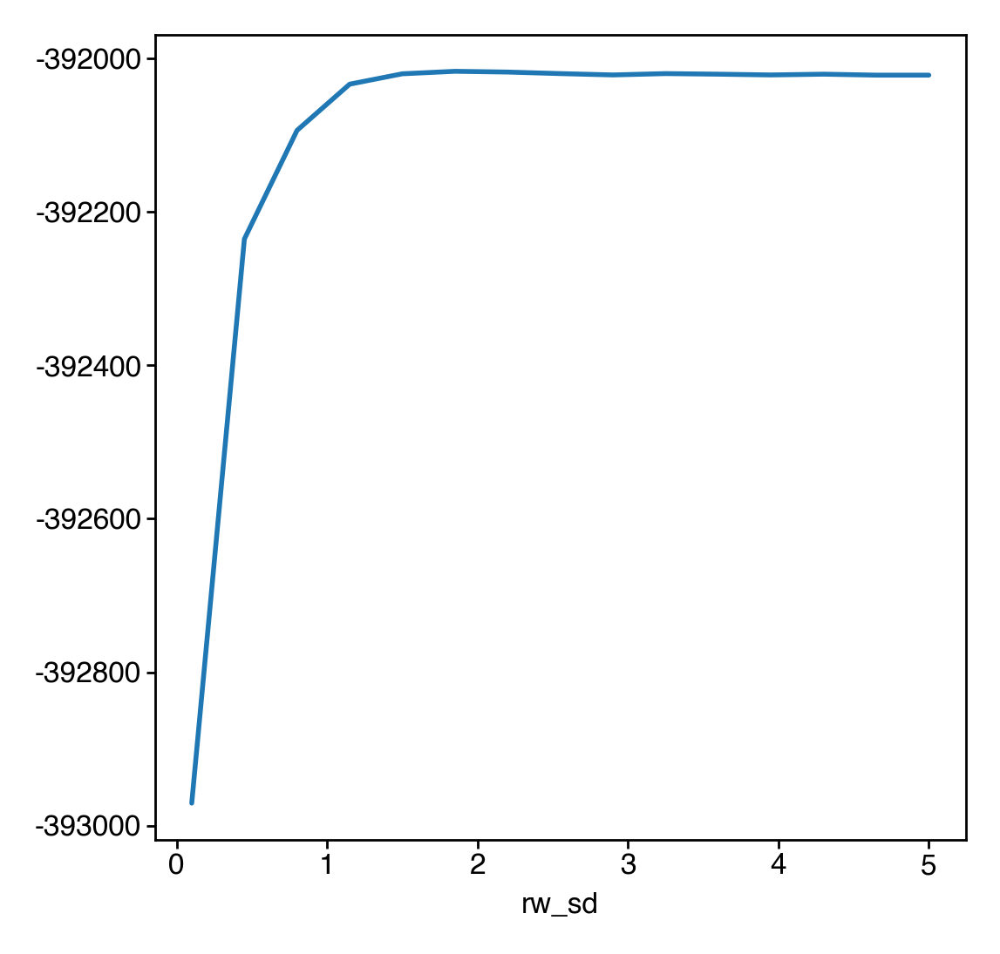

In [14]:
out.set_index('rw_sd').sort_index().query('n_splines == 8')['heldout_ll'].plot()

In [100]:
# find a specific parameter set
param_set = dict(
    age_sd=11,
    n_splines=5,
    rw_sd=10,
)
for f in tqdm(files):
    tmp = joblib.load(f)
    matches = []
    for k, v in tmp['grid_params'].items():
        matches.append(param_set[k] == v)
    if all(matches):
        break

  0%|          | 0/306 [00:00<?, ?it/s]

In [101]:
tmp['grid_params']

{'age_sd': 11.0, 'n_splines': 5, 'rw_sd': 10.0}

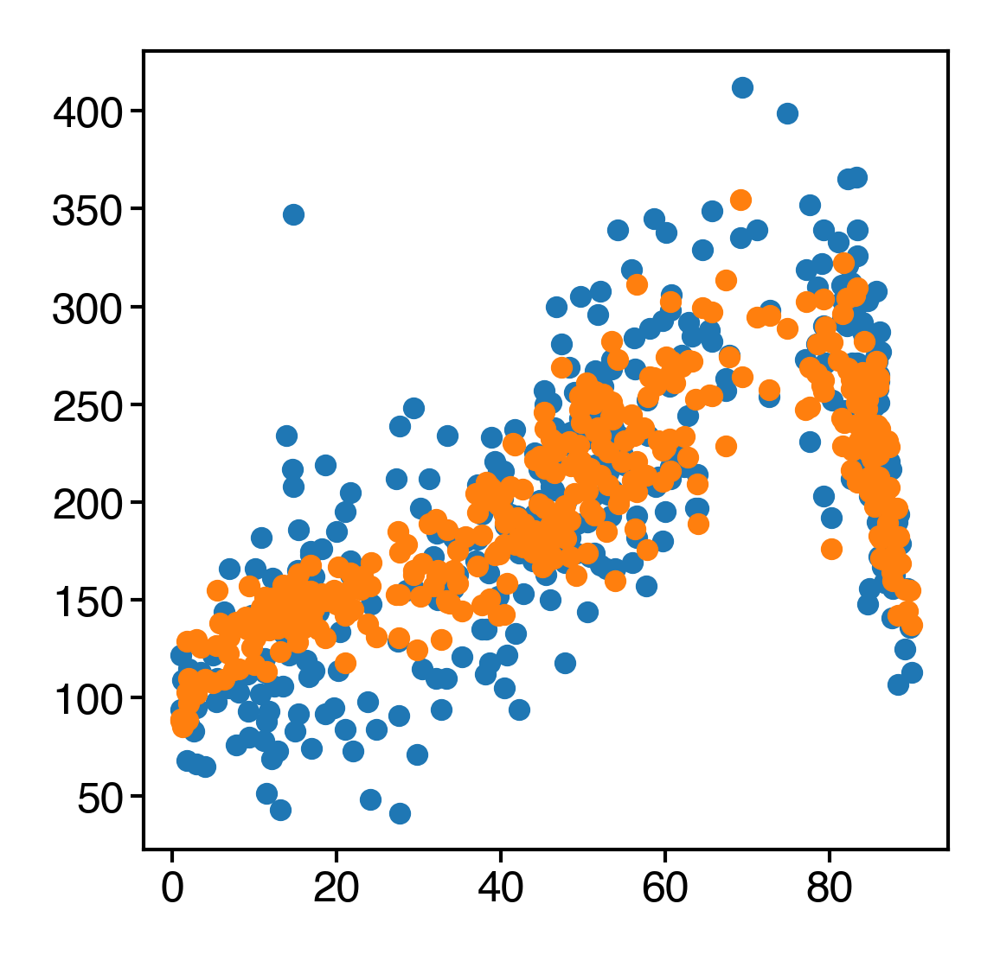

In [102]:
ba = tmp[0]['bio_ages']
ca = tmp[0]['true_ages']
pc = tmp[0]['predicted_counts'][:, 0]
c = tmp[0]['counts'][:, 0]
figure(2, 2)
plt.scatter(ba, c, s=5)
plt.scatter(ba, pc, s=5)

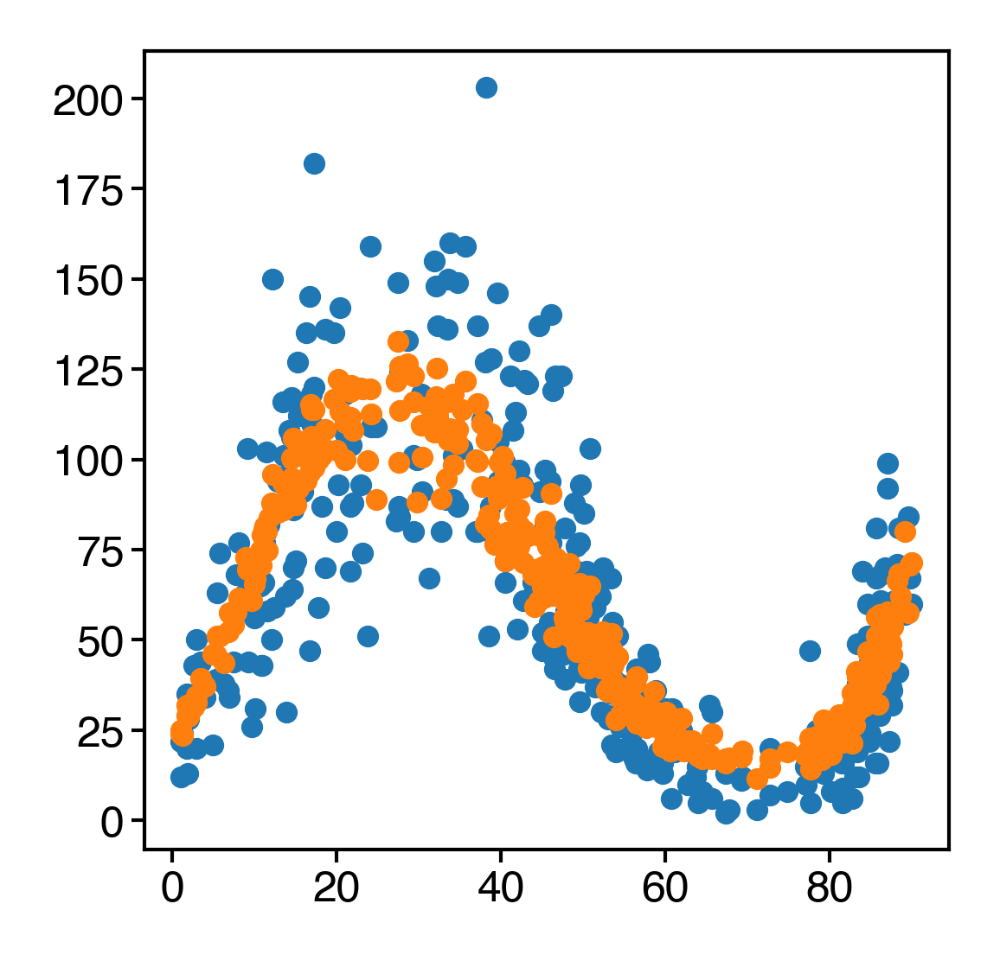

In [103]:
syll = 14
ba = tmp[0]['bio_ages']
ca = tmp[0]['true_ages']
pc = tmp[0]['predicted_counts'][:, syll]
c = tmp[0]['counts'][:, syll]
figure(2, 2)
plt.scatter(ba, c, s=5)
plt.scatter(ba, pc, s=5)

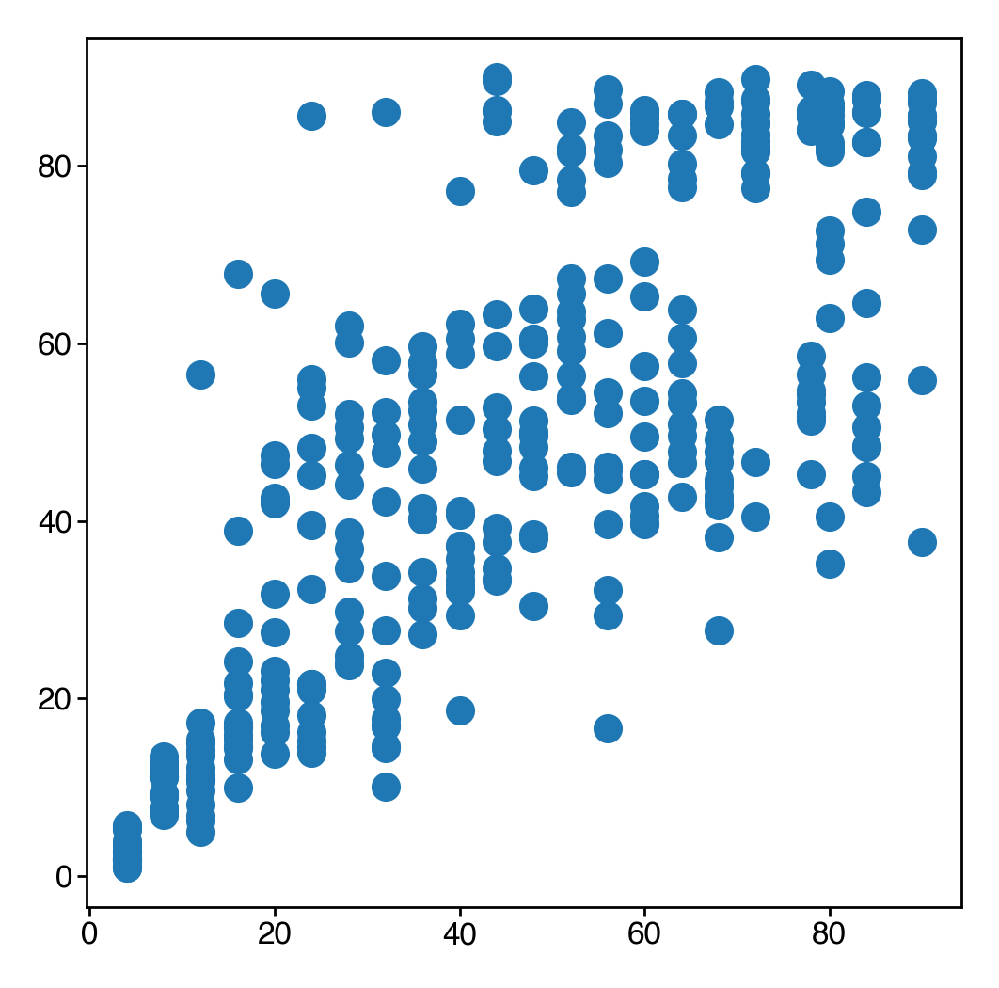

In [104]:
plt.scatter(ca, ba)

<Axes: ylabel='Count'>

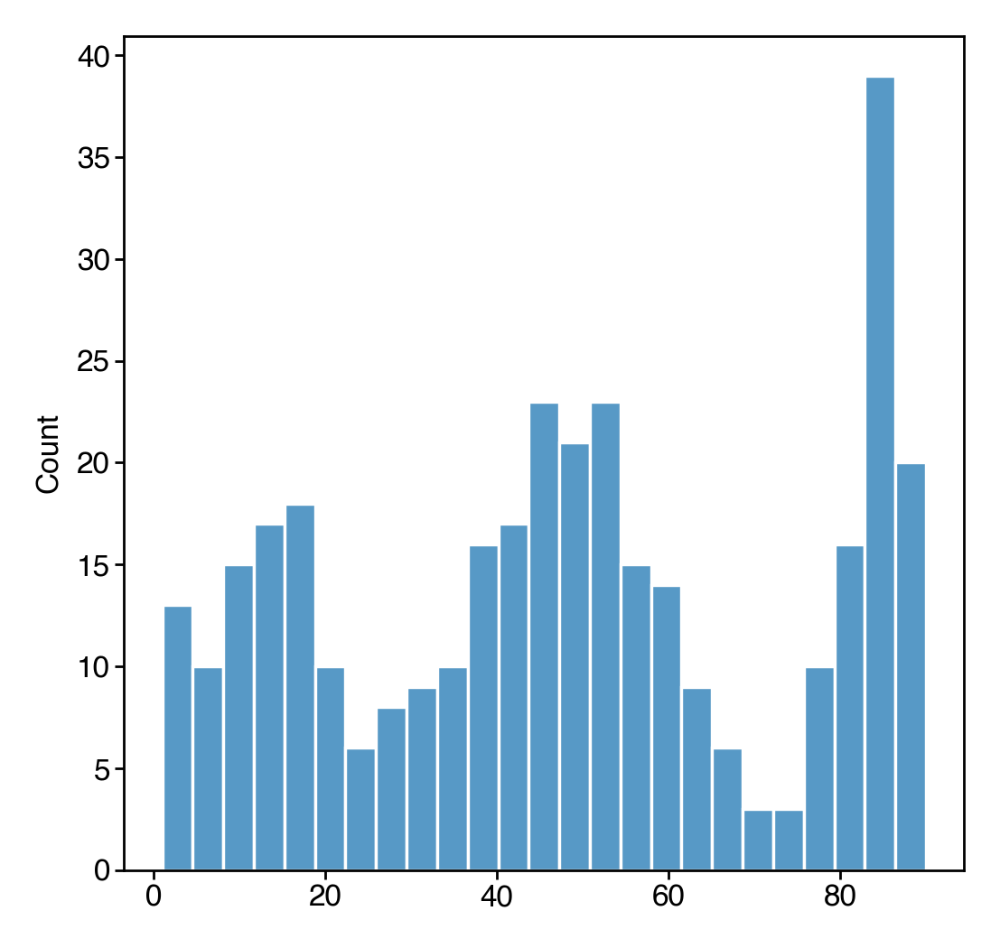

In [105]:
sns.histplot(ba, bins=25)

<Axes: ylabel='Density'>

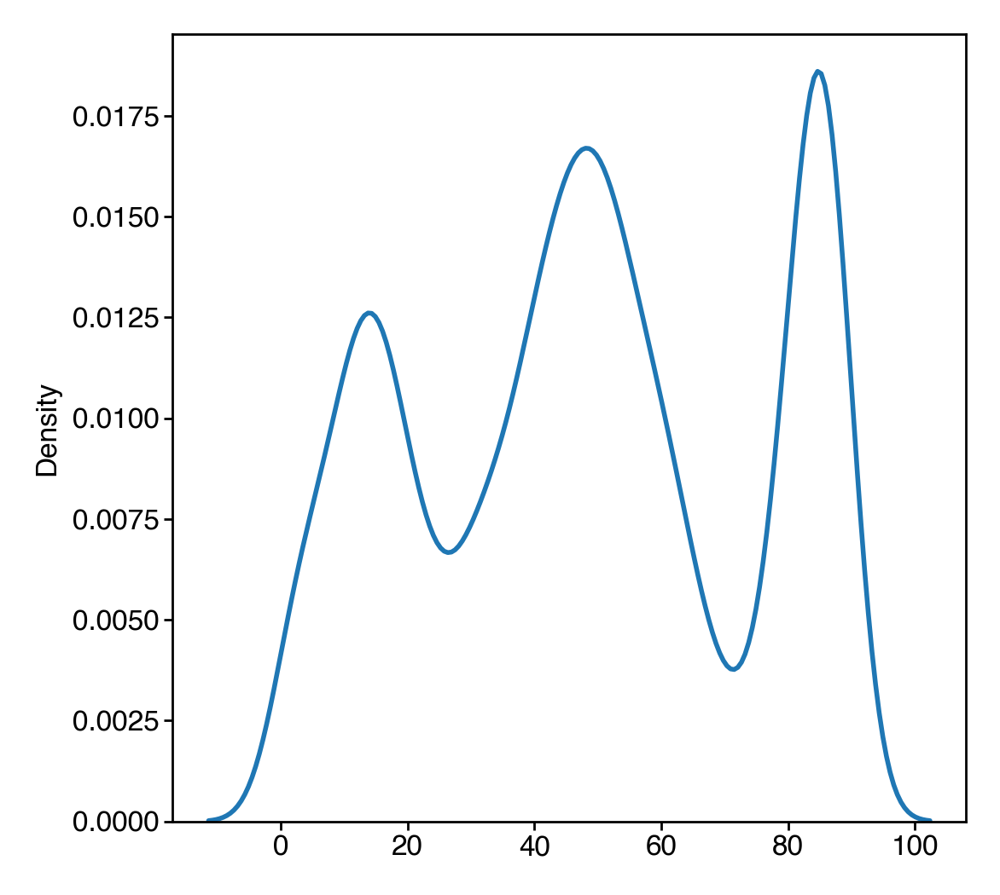

In [106]:
sns.kdeplot(ba, bw_adjust=0.5)

## How do BA and CA look for different `rw_sd`'s and `age_sd`'s?

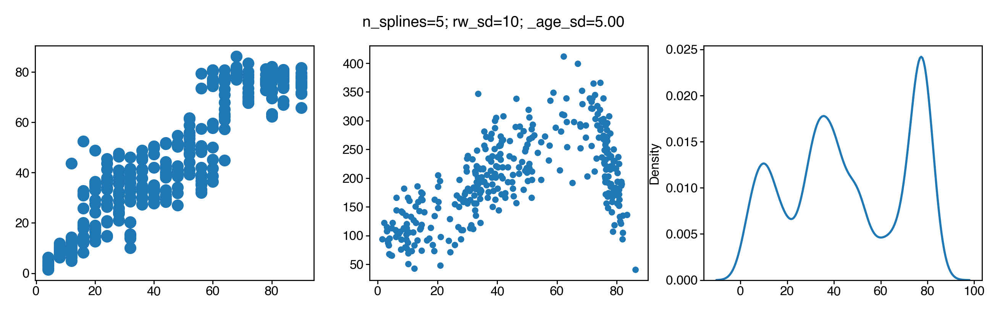

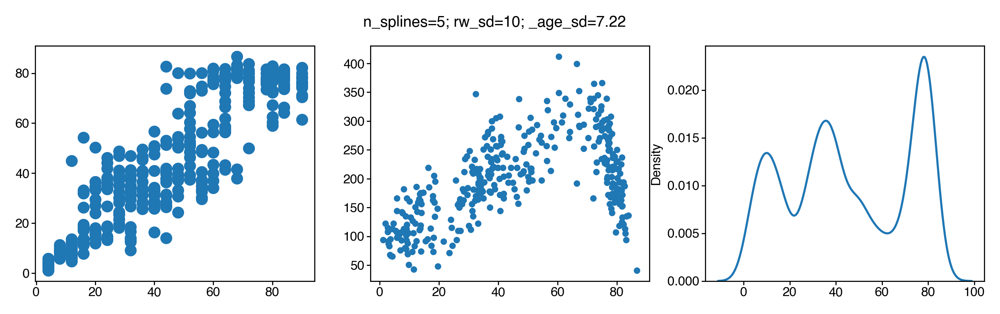

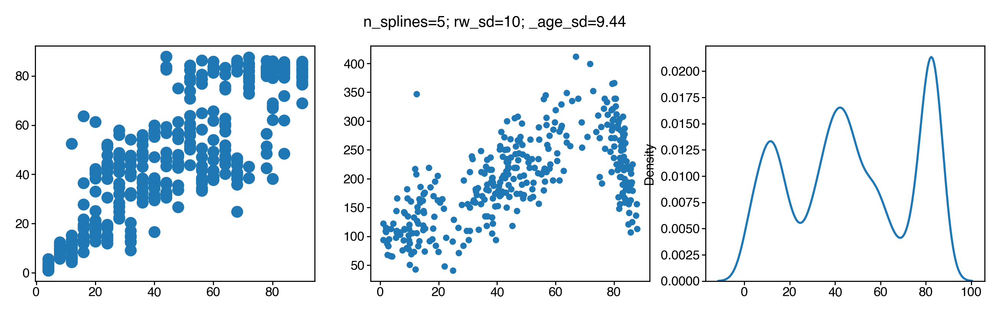

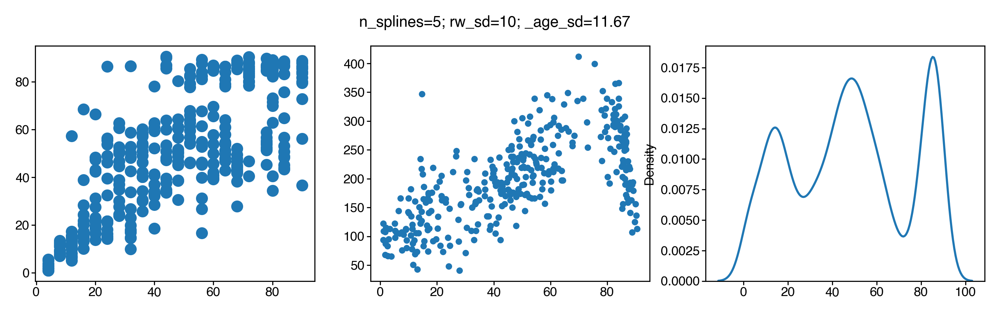

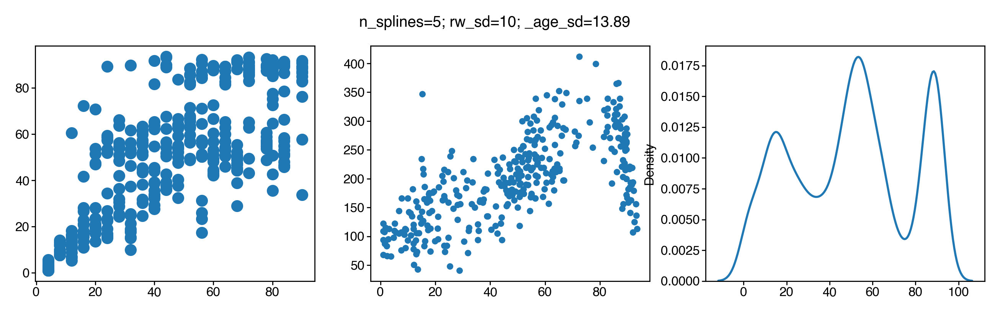

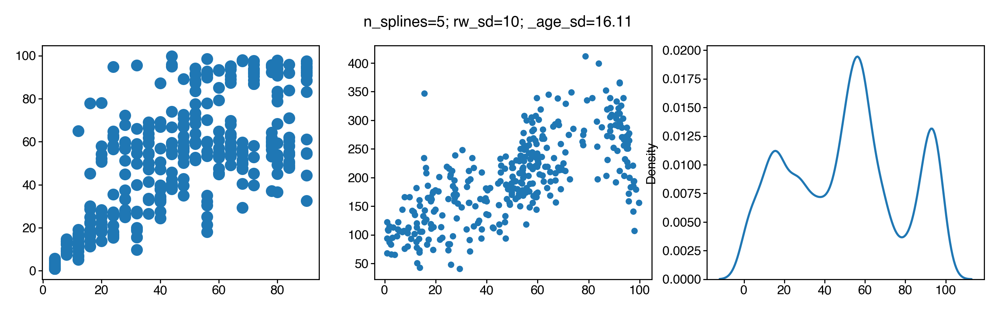

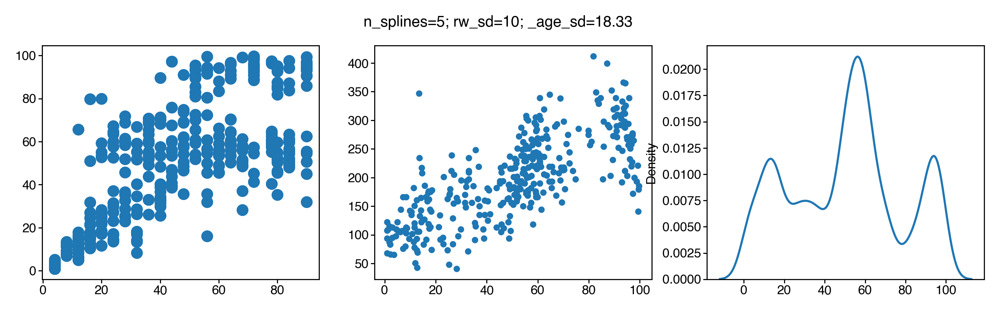

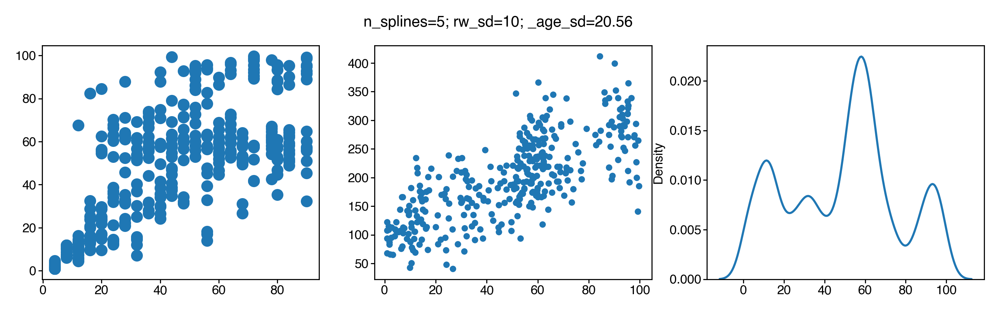

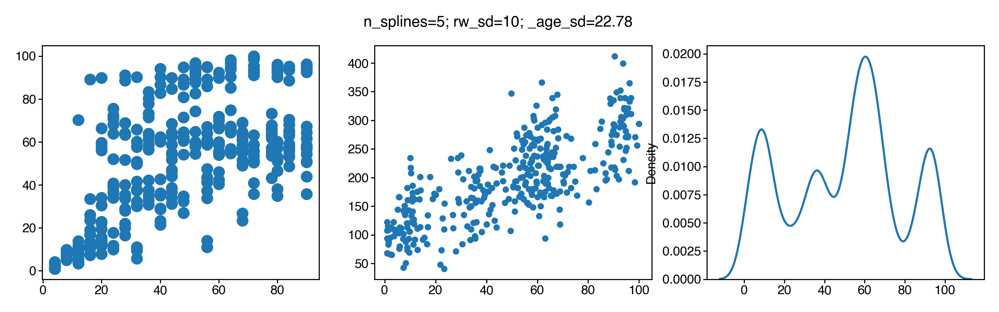

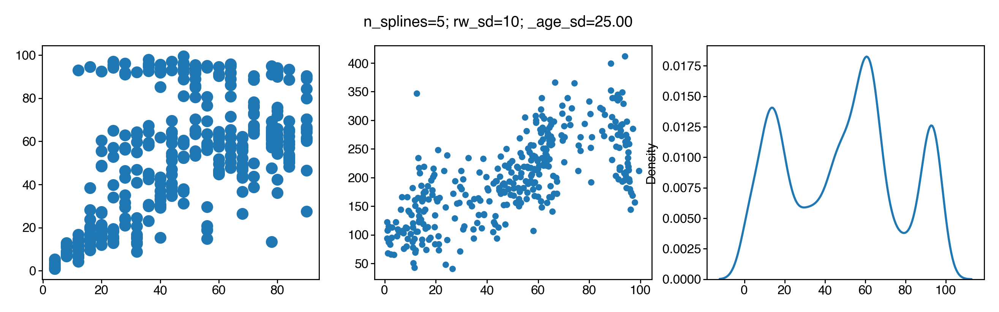

In [114]:
age_sds = np.linspace(5, 25, 10)
n_splines = 5
rw_sd = 10
hypparams["n_splines"] = n_splines
hypparams["rw_sd"] = rw_sd

for _age_sd in age_sds:
    hypparams["age_sd"] = float(_age_sd)
    tmp = masked_xval(features, hypparams, 2, n_repeats=1, disable_tqdm=True)
    ba = tmp[0]['bio_ages']
    ca = tmp[0]['true_ages']
    pc = tmp[0]['predicted_counts'][:, 0]
    c = tmp[0]['counts'][:, 0]
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    sns.kdeplot(ba, bw_adjust=0.5, ax=ax[2])
    ax[0].scatter(ca, ba)
    ax[1].scatter(ba, c, s=5)
    fig.suptitle(f"{n_splines=}; {rw_sd=}; {_age_sd=:0.2f}")
    plt.show()

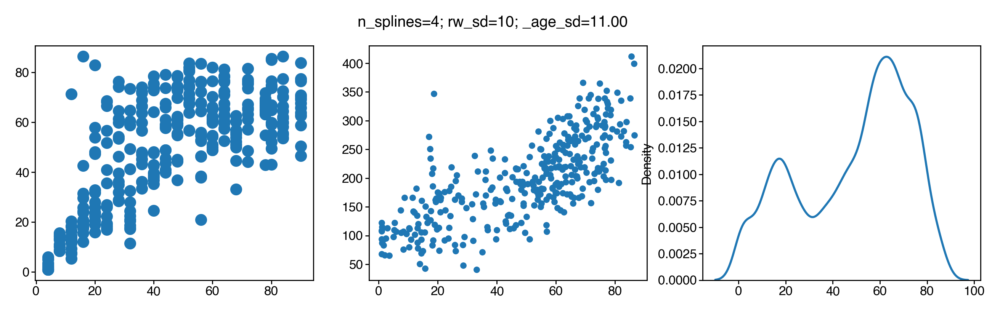

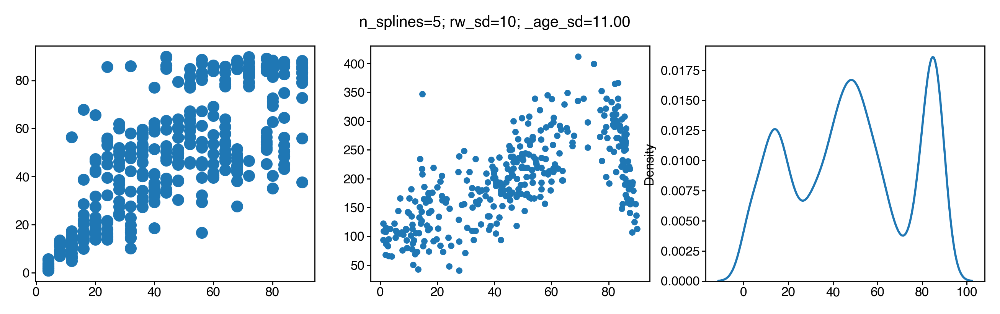

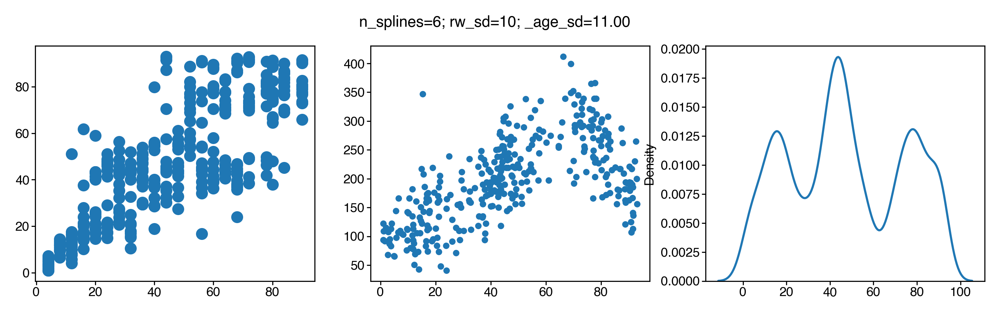

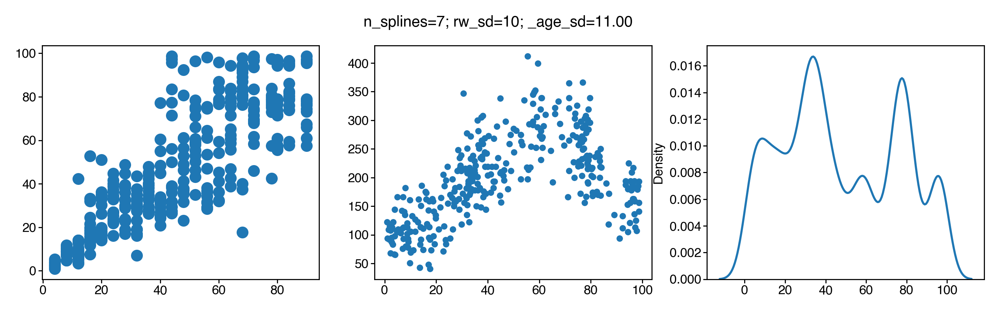

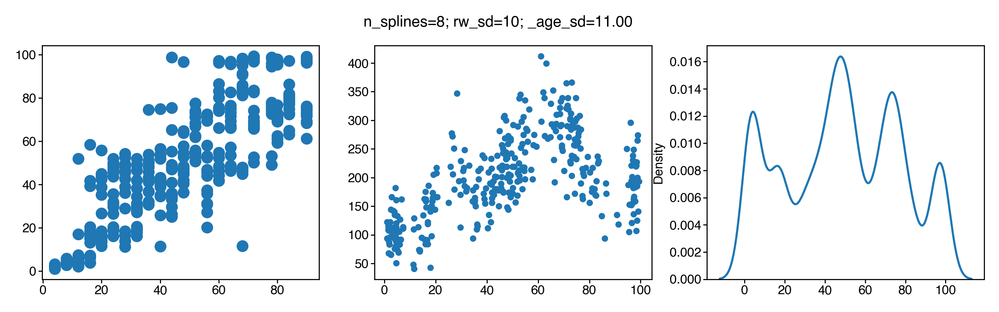

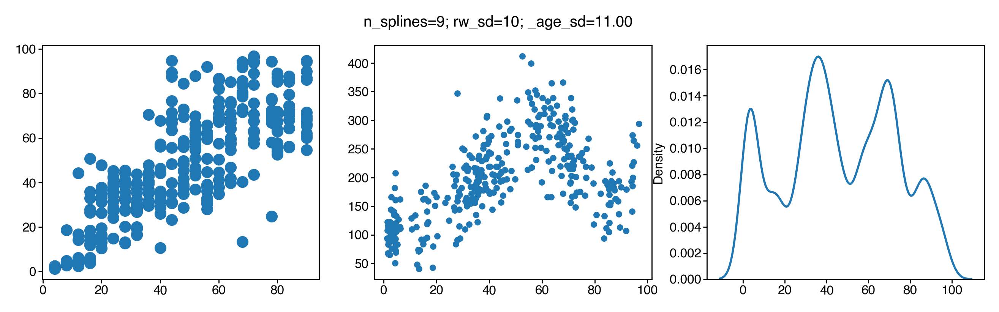

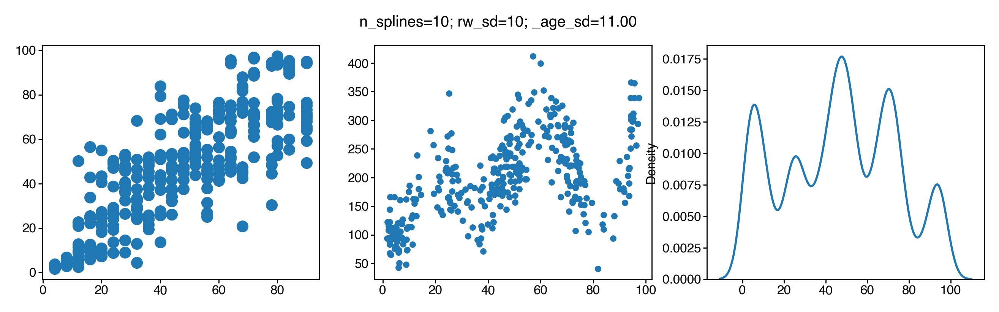

In [115]:
_age_sd = 11
rw_sd = 10
hypparams["rw_sd"] = rw_sd
hypparams["age_sd"] = float(_age_sd)

for n_splines in range(4, 11):
    hypparams["n_splines"] = n_splines
    tmp = masked_xval(features, hypparams, 2, n_repeats=1, disable_tqdm=True)
    ba = tmp[0]['bio_ages']
    ca = tmp[0]['true_ages']
    pc = tmp[0]['predicted_counts'][:, 0]
    c = tmp[0]['counts'][:, 0]
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    sns.kdeplot(ba, bw_adjust=0.5, ax=ax[2])
    ax[0].scatter(ca, ba)
    ax[1].scatter(ba, c, s=5)
    fig.suptitle(f"{n_splines=}; {rw_sd=}; {_age_sd=:0.2f}")
    plt.show()

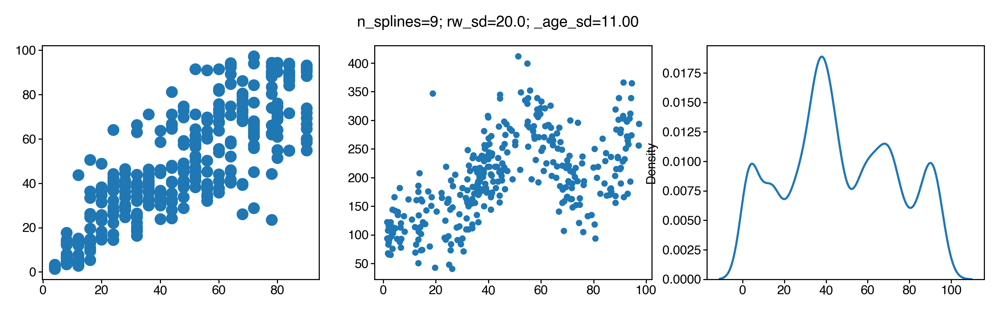

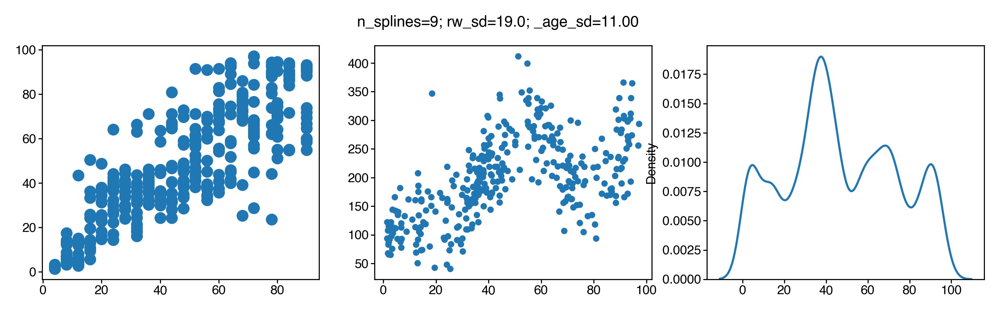

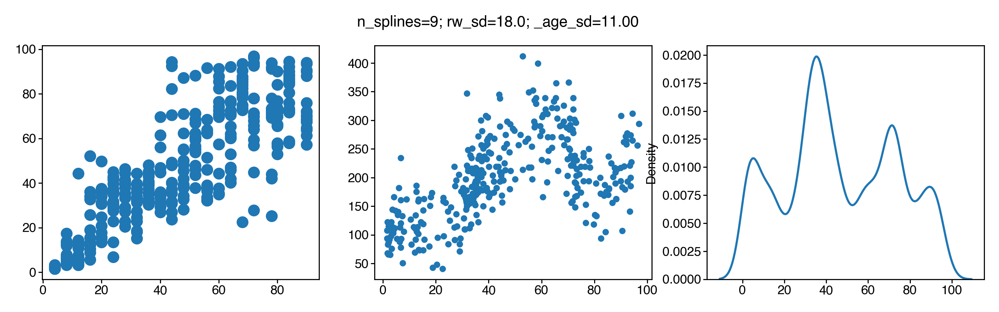

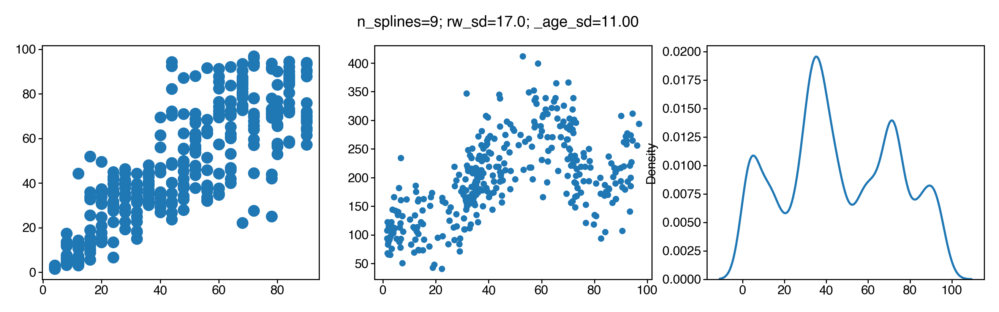

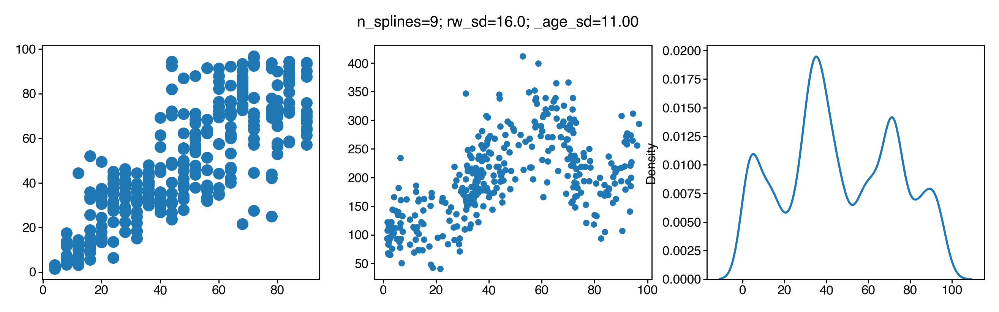

...

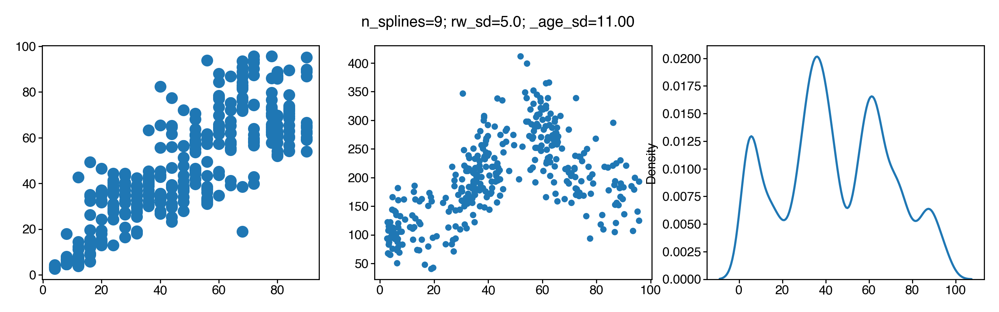

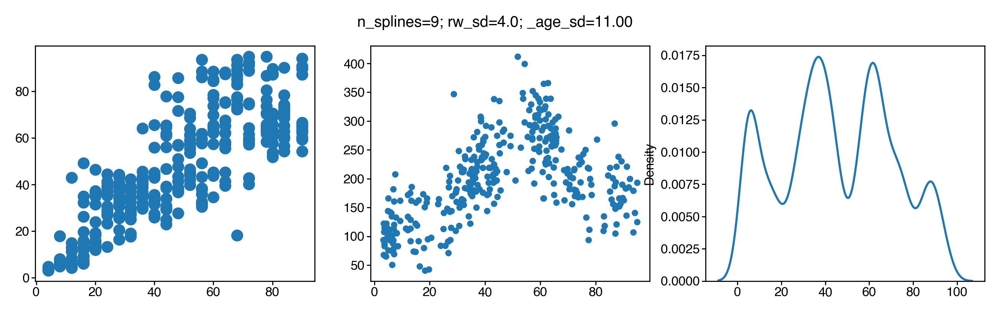

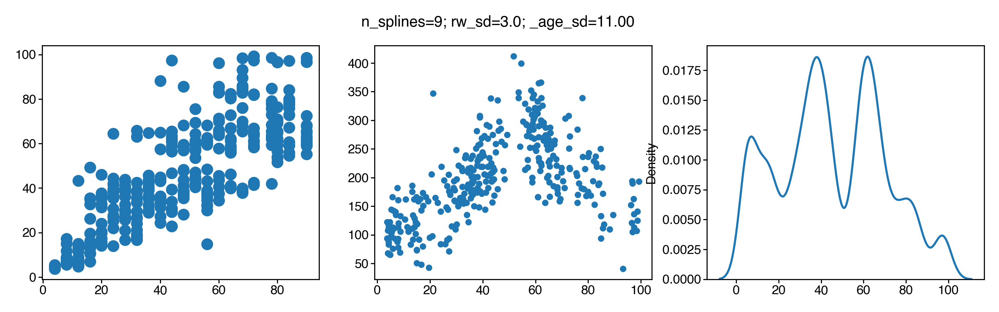

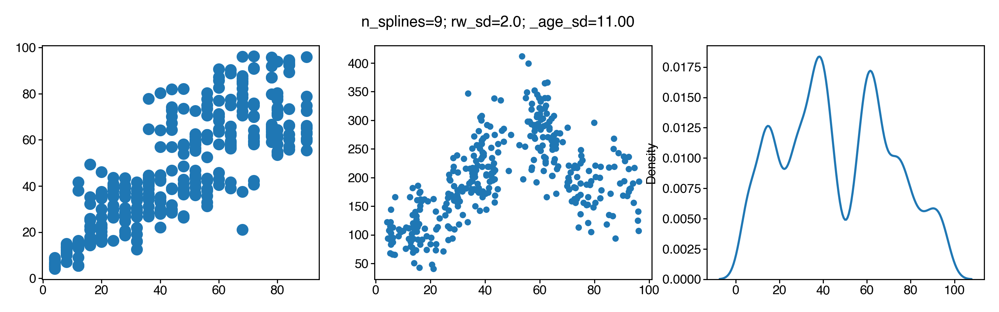

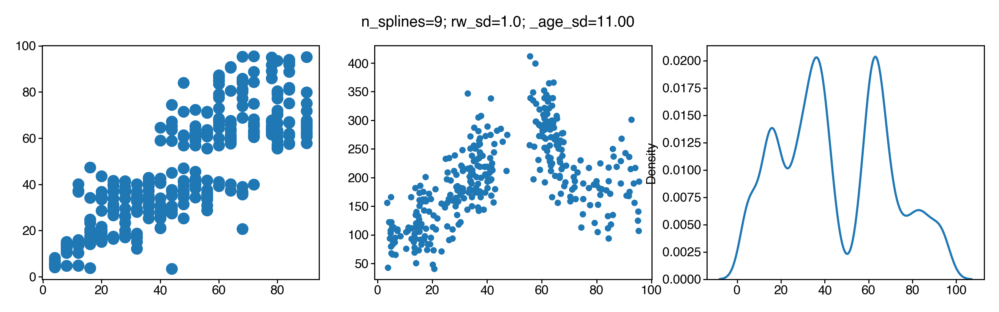

In [117]:
_age_sd = 11
n_splines = 9
hypparams["n_splines"] = n_splines
hypparams["age_sd"] = float(_age_sd)

for rw_sd in np.linspace(1, 20, 20)[::-1]:
    hypparams["rw_sd"] = float(rw_sd)
    tmp = masked_xval(features, hypparams, 2, n_repeats=1, disable_tqdm=True)
    ba = tmp[0]['bio_ages']
    ca = tmp[0]['true_ages']
    pc = tmp[0]['predicted_counts'][:, 0]
    c = tmp[0]['counts'][:, 0]
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    sns.kdeplot(ba, bw_adjust=0.5, ax=ax[2])
    ax[0].scatter(ca, ba)
    ax[1].scatter(ba, c, s=5)
    fig.suptitle(f"{n_splines=}; {rw_sd=}; {_age_sd=:0.2f}")
    plt.show()

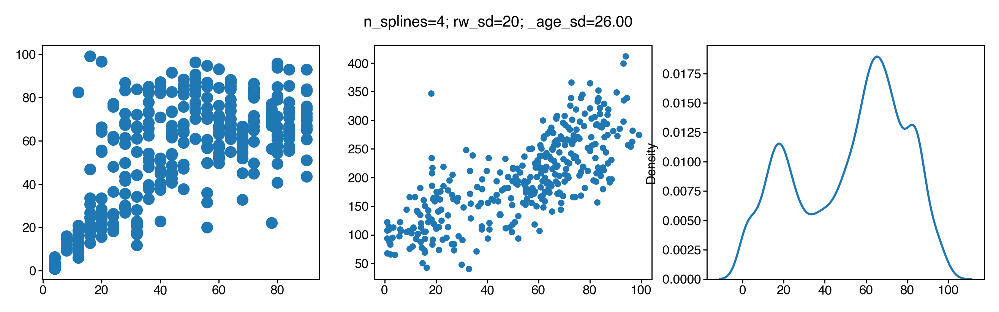

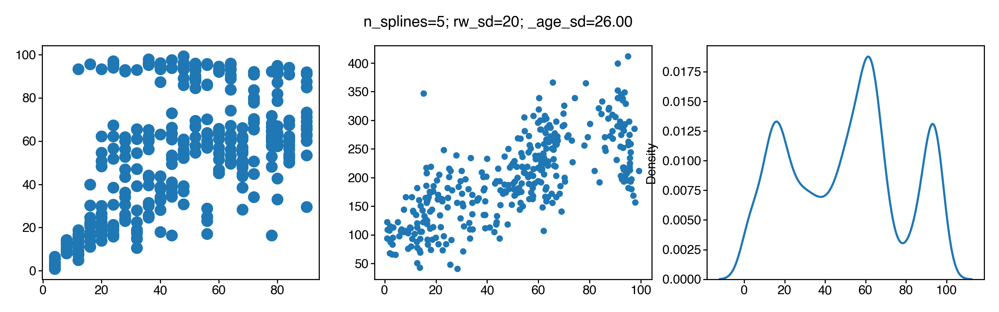

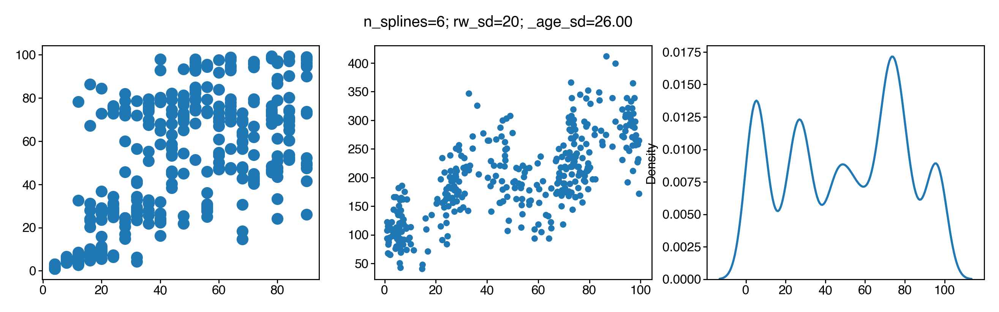

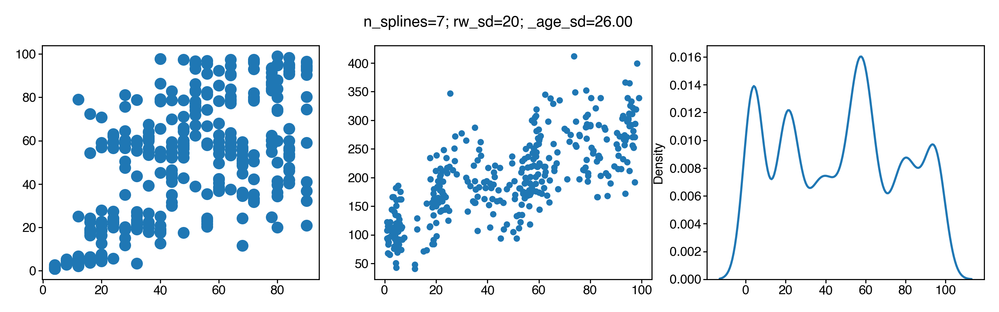

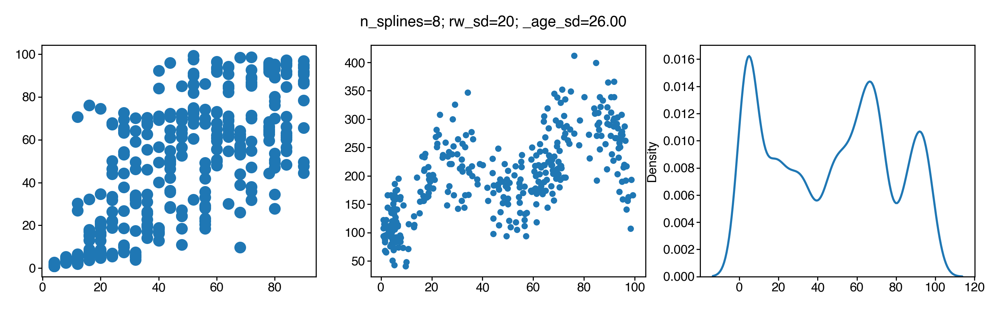

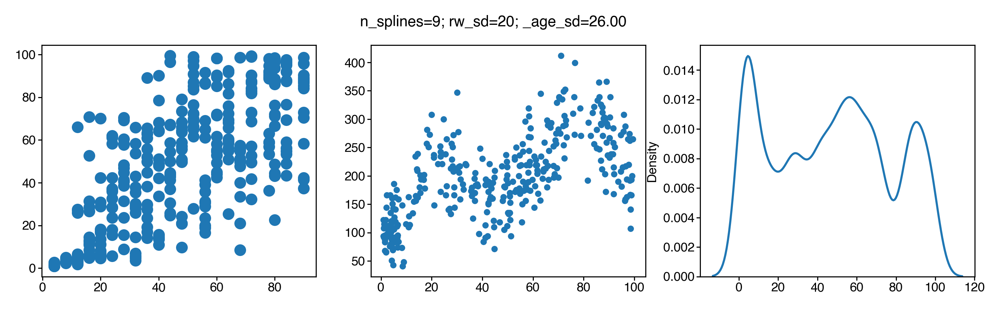

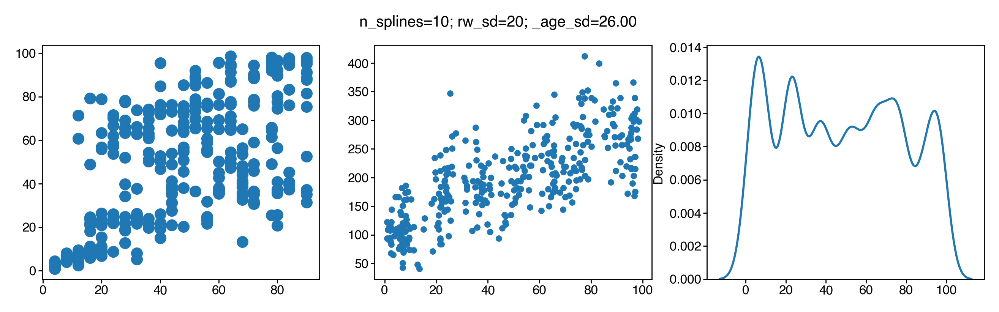

In [118]:
_age_sd = 26
rw_sd = 20
hypparams["rw_sd"] = rw_sd
hypparams["age_sd"] = float(_age_sd)

for n_splines in range(4, 11):
    hypparams["n_splines"] = n_splines
    tmp = masked_xval(features, hypparams, 2, n_repeats=1, disable_tqdm=True)
    ba = tmp[0]['bio_ages']
    ca = tmp[0]['true_ages']
    pc = tmp[0]['predicted_counts'][:, 0]
    c = tmp[0]['counts'][:, 0]
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    sns.kdeplot(ba, bw_adjust=0.5, ax=ax[2])
    ax[0].scatter(ca, ba)
    ax[1].scatter(ba, c, s=5)
    fig.suptitle(f"{n_splines=}; {rw_sd=}; {_age_sd=:0.2f}")
    plt.show()

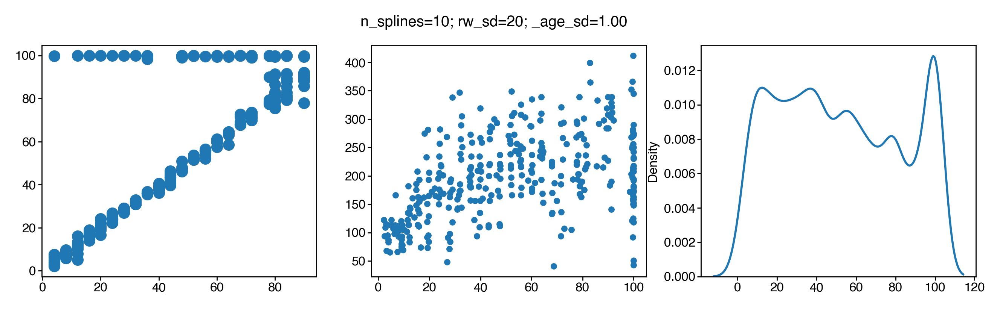

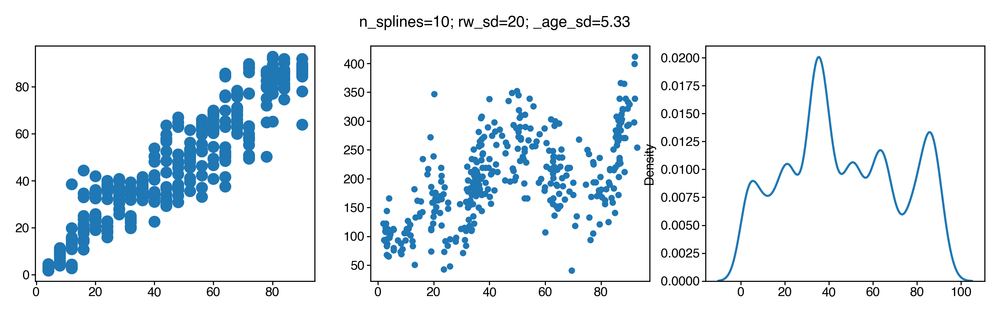

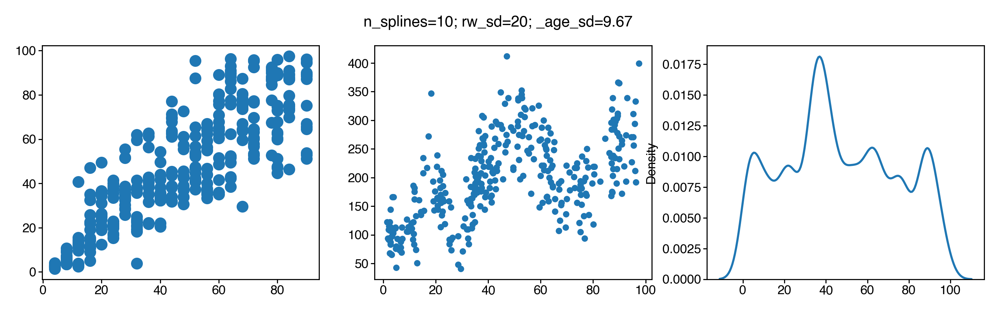

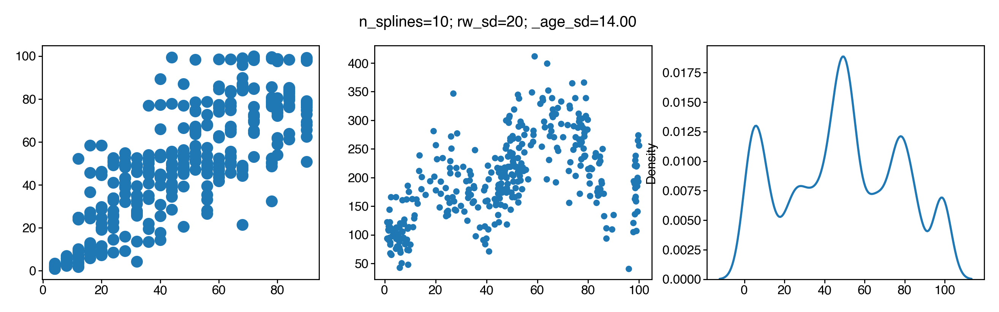

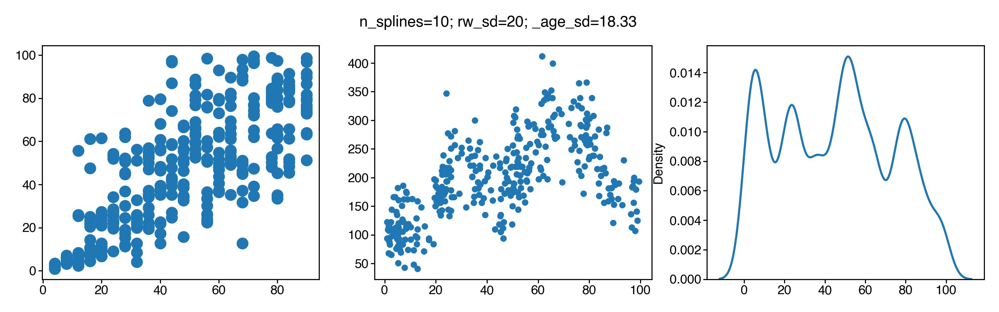

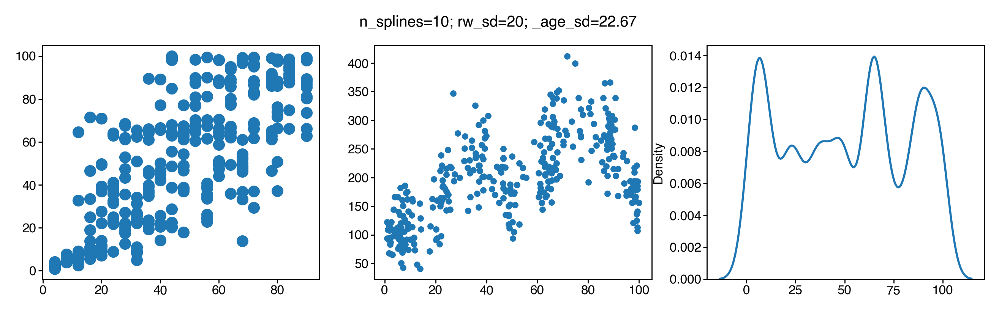

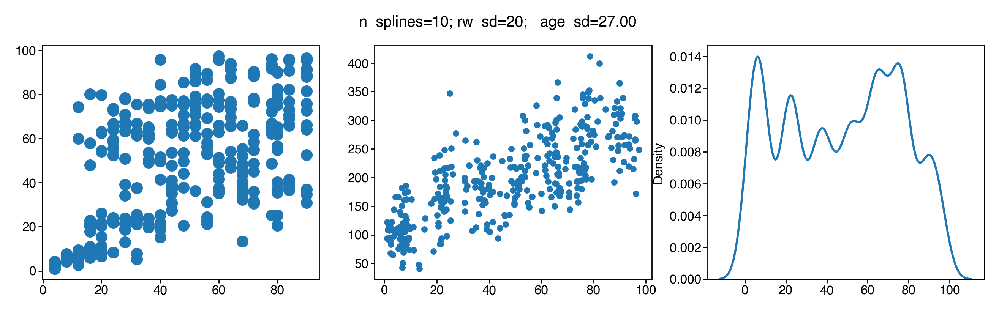

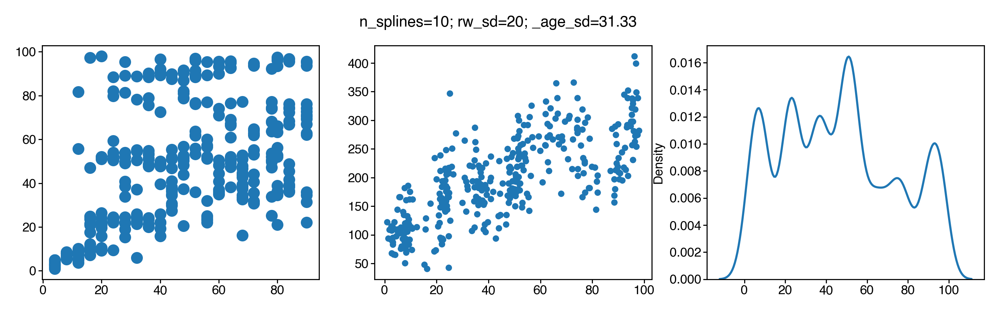

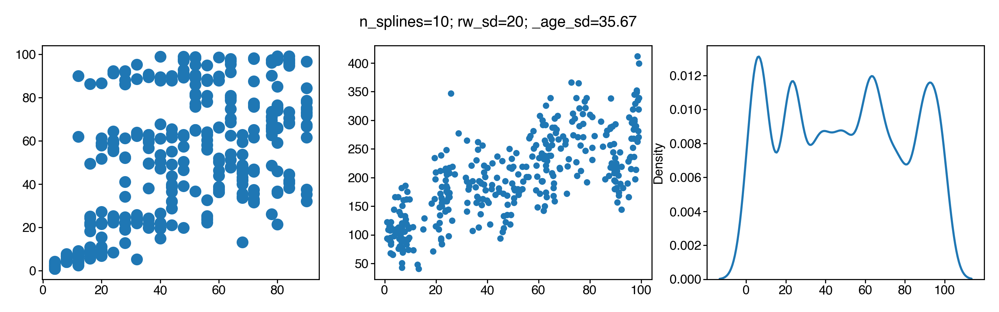

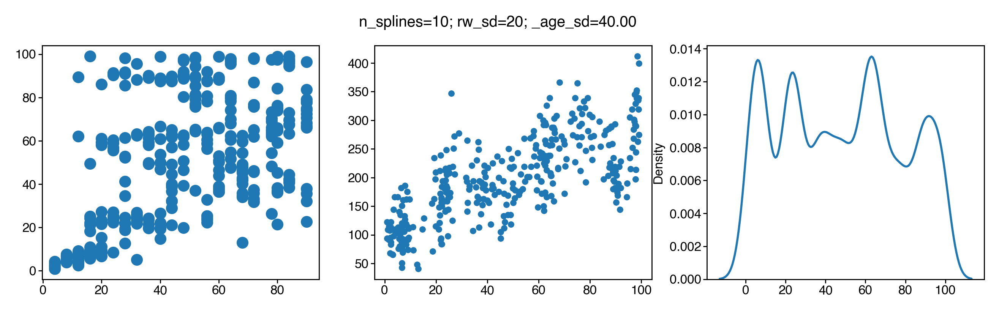

In [119]:
age_sds = np.linspace(1, 40, 10)
n_splines = 10
rw_sd = 20
hypparams["n_splines"] = n_splines
hypparams["rw_sd"] = rw_sd

for _age_sd in age_sds:
    hypparams["age_sd"] = float(_age_sd)
    tmp = masked_xval(features, hypparams, 2, n_repeats=1, disable_tqdm=True)
    ba = tmp[0]['bio_ages']
    ca = tmp[0]['true_ages']
    pc = tmp[0]['predicted_counts'][:, 0]
    c = tmp[0]['counts'][:, 0]
    fig, ax = plt.subplots(1, 3, figsize=(8, 2))
    sns.kdeplot(ba, bw_adjust=0.5, ax=ax[2])
    ax[0].scatter(ca, ba)
    ax[1].scatter(ba, c, s=5)
    fig.suptitle(f"{n_splines=}; {rw_sd=}; {_age_sd=:0.2f}")
    plt.show()

## Optimize parameter set for the fewest splines

In [126]:
rw_prior = np.linspace(0.1, 100, 6)

age_sd = np.linspace(5, 100, 6)

n_splines = [4]

In [ ]:
random.seed(0)
grid = list(product(n_splines, age_sd, rw_prior))
random.shuffle(grid)

out = []
for i, (_n_splines, _age_sd, _rw_prior) in enumerate(tqdm(grid)):
    hypparams["n_splines"] = _n_splines
    hypparams["age_sd"] = float(_age_sd)
    hypparams["rw_sd"] = float(_rw_prior)
    try:
        tmp = masked_xval(features, hypparams, 2, n_repeats=3, disable_tqdm=True)
        for v in tmp.values():
            v["init_components"].age_normalizer = None
            v["init_components"].age_unnormalizer = None
        tmp["grid_params"] = keyfilter(
            lambda k: k in ["n_splines", "age_sd", "rw_sd"], hypparams
        )
        # joblib.dump(
        #     tmp,
        #     f"/n/scratch/users/w/wg41/bio-age-model/2024-04-10-random-walk-prior/ontogeny-gridsearch-high-definition-2024-04-10-iter-{i:03d}.p",
        # )
        heldout_ll = list(
            pluck("heldout_ll", keyfilter(lambda k: isinstance(k, int), tmp).values())
        )
        heldout_ll = np.mean(heldout_ll)
        heldout_r2 = list(
            pluck(
                "heldout_r2_total_v3", keyfilter(lambda k: isinstance(k, int), tmp).values()
            )
        )
        heldout_r2 = np.mean(heldout_r2)
        param_norm = np.mean(
            [
                np.linalg.norm(v["params"]["bio_basis_weights"], axis=1).mean()
                for v in keyfilter(lambda k: isinstance(k, int), tmp).values()
            ]
        )
        out.append(
            {
                **tmp["grid_params"],
                "param_norm": param_norm,
                "heldout_ll": heldout_ll,
                "heldout_r2": heldout_r2,
            }
        )
    except ValueError:
        continue
out = pd.DataFrame(out)

  0%|          | 0/36 [00:00<?, ?it/s]

In [ ]:
sns.heatmap(pd.pivot_table(out, columns='age_sd', index='rw_sd', values='heldout_ll', aggfunc='max'), cbar_kws=dict(label="Heldout LL"))